# Evaluate mock community classification accuracy
The purpose of this notebook is to evaluate taxonomic classification accuracy of mock communities using different classification methods.

Prepare the environment
-----------------------

First we'll import various functions that we'll need for generating the report. 

In [1]:
%matplotlib inline
from os.path import join, exists, expandvars
import pandas as pd
from IPython.display import display, Markdown
import seaborn.xkcd_rgb as colors
from tax_credit.plotting_functions import (pointplot_from_data_frame,
                                           boxplot_from_data_frame,
                                           heatmap_from_data_frame,
                                           per_level_kruskal_wallis,
                                           beta_diversity_pcoa,
                                           average_distance_boxplots,
                                           rank_optimized_method_performance_by_dataset)
from tax_credit.eval_framework import (evaluate_results,
                                       method_by_dataset_a1,
                                       parameter_comparisons,
                                       merge_expected_and_observed_tables,
                                       filter_df)

Configure local environment-specific values
-------------------------------------------

**This is the only cell that you will need to edit to generate basic reports locally.** After editing this cell, you can run all cells in this notebook to generate your analysis report. This will take a few minutes to run, as results are computed at multiple taxonomic levels.

Values in this cell will not need to be changed, with the exception of ``project_dir``, to generate the default results contained within tax-credit. To analyze results separately from the tax-credit precomputed results, other variables in this cell will need to be set.

In [2]:
## project_dir should be the directory where you've downloaded (or cloned) the 
## tax-credit repository. 
project_dir = expandvars("../../")

## expected_results_dir contains expected composition data in the structure
## expected_results_dir/<dataset name>/<reference name>/expected/
expected_results_dir = join(project_dir, "data/precomputed-results/", "mock-community")

## mock_results_fp designates the files to which summary results are written.
## If this file exists, it can be read in to generate results plots, instead
## of computing new scores.
mock_results_fp = join(expected_results_dir, 'mock_results.tsv')

## results_dirs should contain the directory or directories where
## results can be found. By default, this is the same location as expected 
## results included with the project. If other results should be included, 
## absolute paths to those directories should be added to this list.
results_dirs = [expected_results_dir]

## directory containing mock community data, e.g., feature table without taxonomy
mock_dir = join(project_dir, "data", "mock-community")

## Minimum number of times an OTU must be observed for it to be included in analyses. Edit this
## to analyze the effect of the minimum count on taxonomic results.
min_count = 1

## Define the range of taxonomic levels over which to compute accuracy scores.
## The default given below will compute order (level 2) through species (level 6)
taxonomy_level_range = range(2,7)


# we can save plots in this directory
outdir = join(expandvars("../../../"), 'plots')

In [3]:
dataset_ids = ['mock-1', 'mock-2', 'mock-3', 'mock-4', 'mock-5', 'mock-7', 'mock-8', 
               #'mock-9', 'mock-10',  # silva not yet available for SEPP
               'mock-12', 'mock-16', 'mock-18', 'mock-19', 'mock-20', 'mock-21', 
               'mock-22', 'mock-23', 'mock-24', 'mock-26-ITS1', 'mock-26-ITS9']
method_ids = ['rdp', 'sortmerna', 'uclust', 'blast', 'blast+', 'naive-bayes', 'naive-bayes-bespoke', 'vsearch', 'sepp-paths', 'sepp-otus']
ref_ids = ['gg_13_8_otus']  #, 'unite_20.11.2016_clean_fullITS']

Find mock community pre-computed tables, expected tables, and "query" tables
----------------------------------------------------------------------------

Next we'll use the paths defined above to find all of the tables that will be compared. These include the *pre-computed result* tables (i.e., the ones that the new methods will be compared to), the *expected result* tables (i.e., the tables containing the known composition of the mock microbial communities), and the *query result* tables (i.e., the tables generated with the new method(s) that we want to compare to the *pre-computed result* tables).

**Note**: if you have added additional methods to add, set `append=True`. If you are attempting to recompute pre-computed results, set `force=True`.

This cell will take a few minutes to run if new results are being added, so hold onto your hat. If you are attempting to re-compute everything, it may take an hour or so, so go take a nap.

In [4]:
mock_results = evaluate_results(results_dirs, 
                                expected_results_dir, 
                                mock_results_fp, 
                                mock_dir,
                                taxonomy_level_range=range(2,7), 
                                min_count=min_count,
                                taxa_to_keep=None, 
                                md_key='taxonomy', 
                                subsample=False,
                                per_seq_precision=True,
                                exclude=['other'],
                                dataset_ids=dataset_ids,
                                reference_ids=ref_ids,
                                method_ids=method_ids,
                                append=False,
                                force=False,
                                backup=False)

../../data/precomputed-results/mock-community/mock_results.tsv already exists.
Reading in pre-computed evaluation results.
To overwrite, set force=True


/home/sjanssen/miniconda3/envs/qiime2-2018.6/src/tax-credit-code/tax_credit/eval_framework.py:460: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  mock_results = pd.DataFrame.from_csv(results_fp, sep='\t')


append==True and force==False
18 new results have been appended to results.


Restrict analyses to a set of datasets or references: e.g., exclude taxonomy assignments made for purpose of reference database comparisons. This can be performed as shown below — alternatively, specific reference databases, datasets, methods, or parameters can be chosen by setting dataset_ids, reference_ids, method_ids, and parameter_ids in the evaluate_results command above.

In [5]:
# mock_results = filter_df(mock_results, column_name='Method', values=['naive-bayes'], exclude=False)
mock_results = mock_results.reset_index(drop=True)

Compute and summarize precision, recall, and F-measure for mock communities
----------------------------------------------------------------------------------------

In this evaluation, we compute and summarize precision, recall, and F-measure of each result (pre-computed and query) based on the known composition of the mock communities. We then summarize the results in two ways: first with boxplots, and second with a table of the top methods based on their F-measures. **Higher scores = better accuracy**

As a first step, we will evaluate **average** method performance at each taxonomic level for each method within each reference dataset type.

**Note that, as parameter configurations can cause results to vary widely, average results are not a good representation of the "best" results. See [here](#Optimized-method-performance) for results using optimized parameters for each method.**

First we will define our [color palette](http://matplotlib.org/examples/color/named_colors.html) and the variables we want to plot. Via seaborn, we can apply the [xkcd crowdsourced color names](https://xkcd.com/color/rgb.txt). If that still doesn't match your hue, use hex codes.

In [8]:
color_palette={
    'expected': 'black', 'rdp': colors['baby shit green'], 'sortmerna': colors['macaroni and cheese'],
    'uclust': 'coral', 'blast': 'indigo', 'blast+': colors['electric purple'], 'naive-bayes': 'dodgerblue',
    'naive-bayes-bespoke': 'blue', 'vsearch': 'firebrick', 'sepp-otus': 'magenta', 'sepp-paths': 'cyan'
}

y_vars = ["Precision", "Recall", "F-measure", "Taxon Accuracy Rate", "Taxon Detection Rate"]

/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages

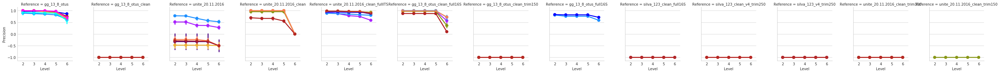

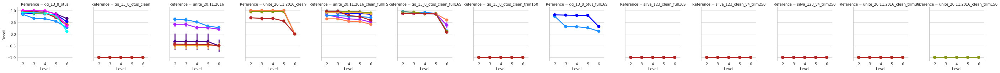

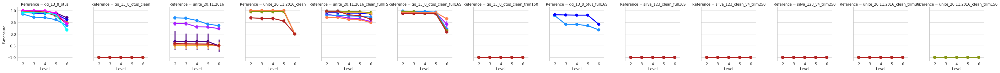

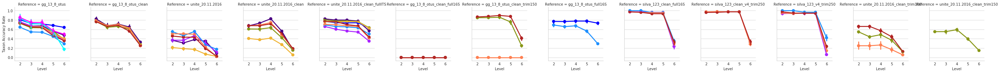

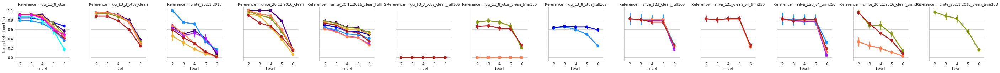

In [9]:
point = pointplot_from_data_frame(mock_results, "Level", y_vars, 
                                  group_by="Reference", color_by="Method",
                                  color_palette=color_palette)

In [10]:
for k, v in point.items():
    v.savefig(join(outdir, 'mock-{0}-lineplots.pdf'.format(k)))

### Kruskal-Wallis between-method accuracy comparisons
Kruskal-Wallis FDR-corrected p-values comparing classification methods at each level of taxonomic assignment

In [10]:
result = per_level_kruskal_wallis(mock_results, y_vars, group_by='Method', 
                                  dataset_col='Reference', level_name='Level',
                                  levelrange=range(2,7), alpha=0.05, 
                                  pval_correction='fdr_bh')
result

,Reference,Variable,2,3,4,5,6
0,gg_13_8_otus,Precision,2.484717e-81,1.341625e-113,6.091030e-97,1.237401e-96,0.000000e+00
1,gg_13_8_otus,Recall,3.277535e-93,0.000000e+00,0.000000e+00,0.000000e+00,4.396896e-281
2,gg_13_8_otus,F-measure,3.163475e-92,0.000000e+00,0.000000e+00,0.000000e+00,4.105754e-297
3,gg_13_8_otus,Taxon Accuracy Rate,2.251841e-64,1.330373e-143,4.779311e-138,0.000000e+00,0.000000e+00
4,gg_13_8_otus,Taxon Detection Rate,1.002194e-34,2.179292e-52,1.340779e-25,4.667539e-253,0.000000e+00
5,gg_13_8_otus_clean,Precision,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
6,gg_13_8_otus_clean,Recall,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
7,gg_13_8_otus_clean,F-measure,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
8,gg_13_8_otus_clean,Taxon Accuracy Rate,1.648557e-16,1.598927e-02,8.697238e-06,4.094662e-11,1.362883e-06
9,gg_13_8_otus_clean,Taxon Detection Rate,7.029450e-85,4.394388e-99,1.842721e-146,2.365548e-74,2.323132e-35


### Heatmaps of per-level accuracy
Heatmaps show the performance of individual method/parameter combinations at each taxonomic level, in each reference database (i.e., for bacterial and fungal mock communities individually).

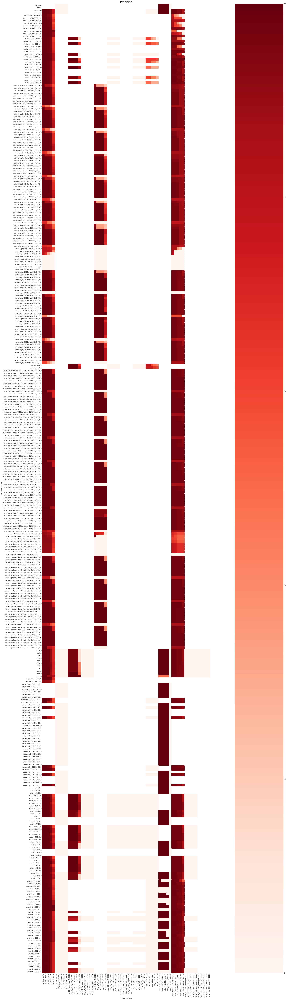

In [11]:
heatmap_from_data_frame(mock_results, metric="Precision", rows=["Method", "Parameters"], cols=["Reference", "Level"])

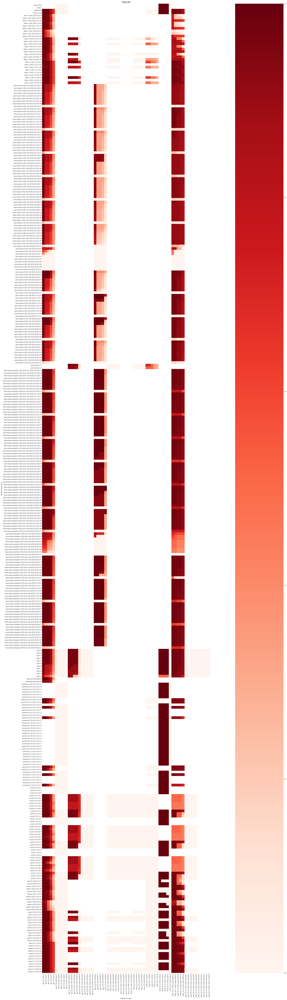

In [12]:
heatmap_from_data_frame(mock_results, metric="Recall", rows=["Method", "Parameters"], cols=["Reference", "Level"])

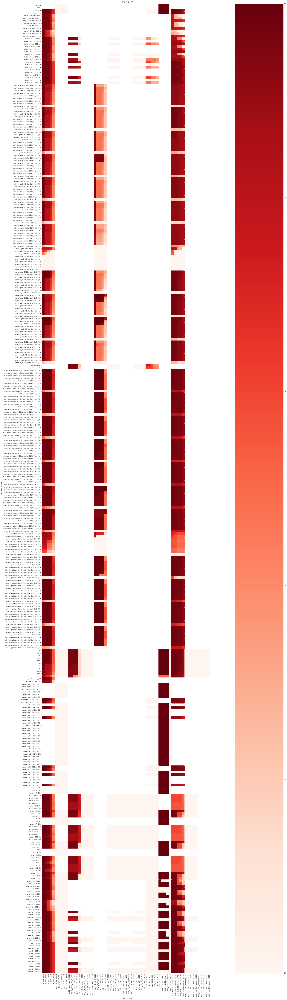

In [13]:
heatmap_from_data_frame(mock_results, metric="F-measure", rows=["Method", "Parameters"], cols=["Reference", "Level"])

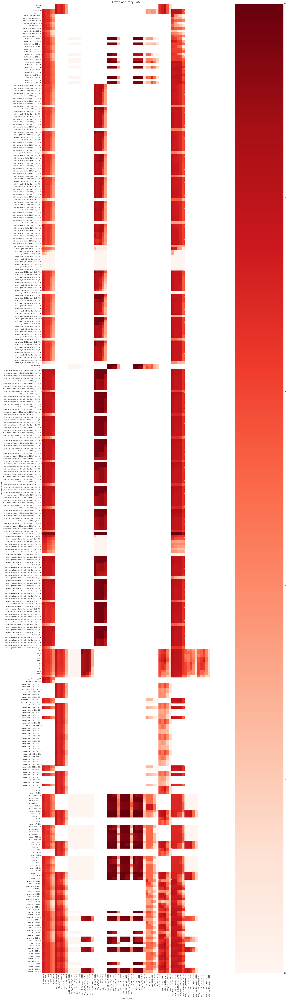

In [14]:
heatmap_from_data_frame(mock_results, metric="Taxon Accuracy Rate", rows=["Method", "Parameters"], cols=["Reference", "Level"])

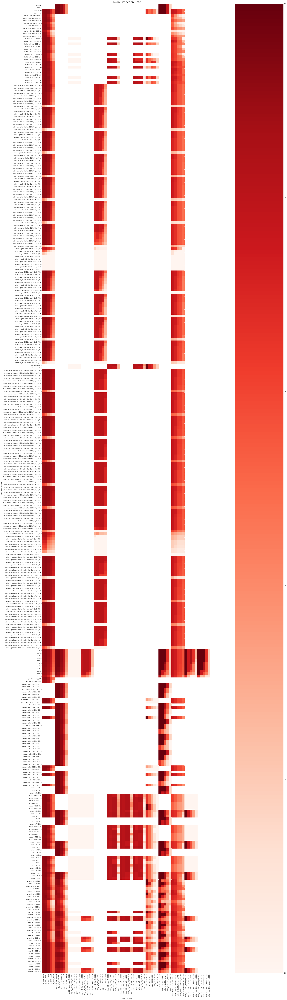

In [15]:
heatmap_from_data_frame(mock_results, metric="Taxon Detection Rate", rows=["Method", "Parameters"], cols=["Reference", "Level"])

Now we will focus on results at **genus** level (for species level, change to level 6)

In [38]:
mock_results_5 = mock_results[mock_results['Level'] == 5]

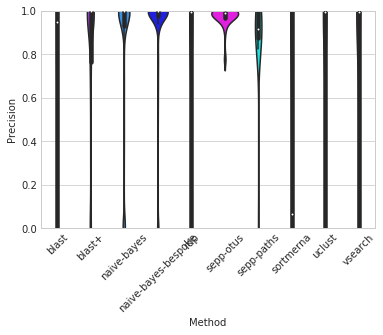

In [39]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Precision", color_palette=color_palette)

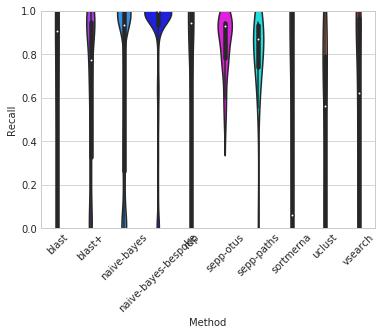

In [40]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Recall", color_palette=color_palette)

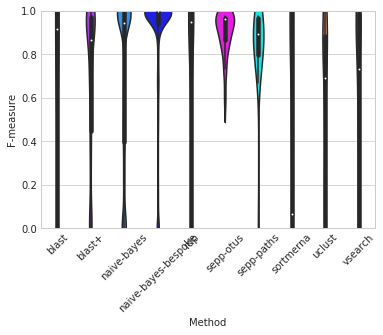

In [41]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="F-measure", color_palette=color_palette)

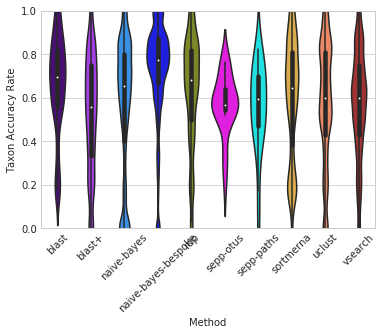

In [42]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Taxon Accuracy Rate", color_palette=color_palette)

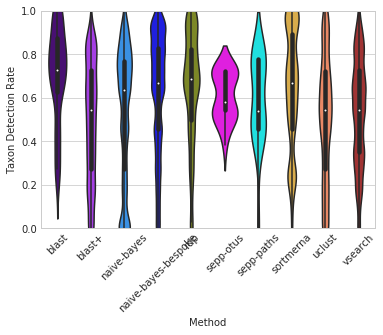

In [43]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Taxon Detection Rate", color_palette=color_palette)

Look at F-measure at **species** level

In [44]:
mock_results_6 = mock_results[mock_results['Level'] == 6]

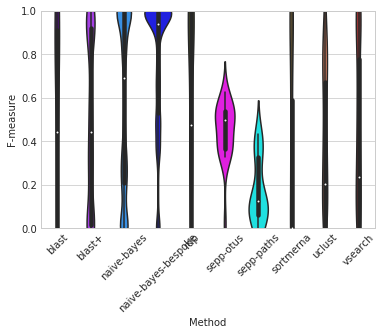

In [45]:
boxplot_from_data_frame(mock_results_6, group_by="Method", metric="F-measure", color_palette=color_palette)

In [46]:
mock_results_5.groupby("Method").median()


,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,5,0.947691,0.908641,0.917634,0.696970,0.727273
blast+,5,0.999948,0.773549,0.865982,0.560000,0.542857
naive-bayes,5,1.000000,0.934087,0.942217,0.653846,0.636364
naive-bayes-bespoke,5,1.000000,0.999990,0.999995,0.772727,0.666667
rdp,5,0.995403,0.942217,0.946674,0.684211,0.685714
sepp-otus,5,0.988953,0.930830,0.960727,0.565217,0.579121
sepp-paths,5,0.918579,0.870397,0.891246,0.596014,0.538462
sortmerna,5,0.065857,0.059092,0.065125,0.643529,0.666667
uclust,5,0.993979,0.561039,0.691000,0.600000,0.545455


In [47]:
mock_results_5.groupby("Method").std()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,0.0,0.922678,0.911271,0.916186,0.226939,0.217653
blast+,0.0,0.420759,0.431446,0.429573,0.266659,0.270690
naive-bayes,0.0,0.360501,0.406564,0.390379,0.308985,0.307031
naive-bayes-bespoke,0.0,0.220976,0.280912,0.265113,0.224474,0.275074
rdp,0.0,0.858910,0.846998,0.849219,0.252830,0.254254
sepp-otus,0.0,0.048174,0.137135,0.100221,0.139640,0.109700
sepp-paths,0.0,0.207238,0.210877,0.205951,0.202305,0.201820
sortmerna,0.0,0.973699,0.945483,0.955208,0.270750,0.271263
uclust,0.0,0.875422,0.771773,0.800056,0.277779,0.283413


In [48]:
mock_results_6.groupby("Method").median()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,6,0.501072,0.370278,0.442637,0.454173,0.416667
blast+,6,0.831230,0.353203,0.443057,0.333333,0.322162
naive-bayes,6,0.934087,0.551021,0.689397,0.461538,0.421053
naive-bayes-bespoke,6,1.000000,0.938547,0.941176,0.700000,0.636364
rdp,6,0.847269,0.425700,0.473379,0.461538,0.454545
sepp-otus,6,0.772128,0.393524,0.499769,0.517626,0.475000
sepp-paths,6,0.614817,0.068084,0.127059,0.208333,0.166667
sortmerna,6,0.000000,0.000000,0.000000,0.333333,0.350000
uclust,6,0.773846,0.116376,0.204620,0.333333,0.250000


In [49]:
mock_results_6.groupby("Method").std()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,0.0,0.854278,0.844780,0.848604,0.204734,0.181898
blast+,0.0,0.469708,0.441991,0.443714,0.244779,0.229940
naive-bayes,0.0,0.372368,0.411540,0.400183,0.263140,0.238720
naive-bayes-bespoke,0.0,0.259479,0.337311,0.306653,0.217715,0.254220
rdp,0.0,0.825286,0.788429,0.796134,0.245905,0.218051
sepp-otus,0.0,0.191318,0.128527,0.131433,0.095016,0.107004
sepp-paths,0.0,0.337163,0.109816,0.145660,0.065090,0.076394
sortmerna,0.0,0.865176,0.818516,0.830598,0.234175,0.197628
uclust,0.0,0.826548,0.664938,0.697672,0.209701,0.186959


In the following heatmaps, we assess accuracy rates in each dataset X method configuration combination. This allows us to assess how evenly configurations affect performance, whether specific mock communities outperform of underperform relative to others, and generally assess how increasing/decreasing specific parameters affects accuracy.

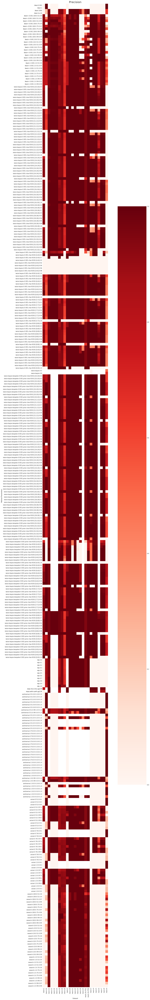

In [50]:
heatmap_from_data_frame(mock_results_5, "Precision")

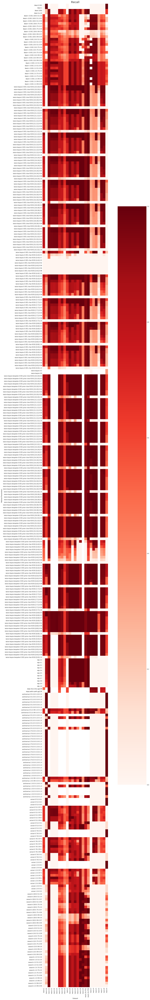

In [51]:
heatmap_from_data_frame(mock_results_5, "Recall")

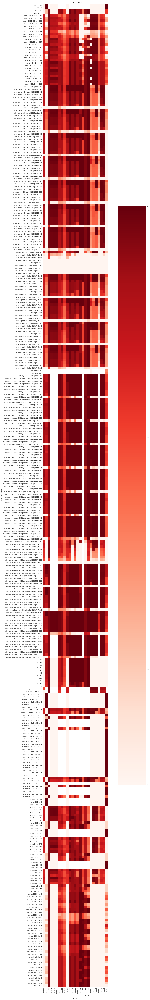

In [52]:
heatmap_from_data_frame(mock_results_5, "F-measure")

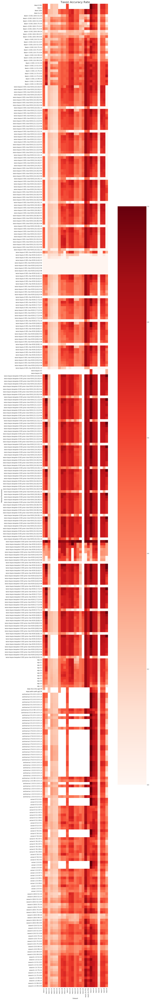

In [53]:
heatmap_from_data_frame(mock_results_5, "Taxon Accuracy Rate")

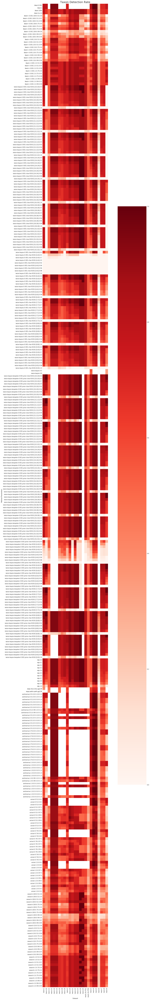

In [54]:
heatmap_from_data_frame(mock_results_5, "Taxon Detection Rate")

### Method Optimization
Which method/parameter configuration performed "best" for a given score? We can rank the top-performing configuration by dataset, method, and taxonomic level.

First, the top-performing method/configuration combination by dataset.

In [55]:
for dataset in mock_results_5['Dataset'].unique():
    display(Markdown('## {0}'.format(dataset)))
    best = method_by_dataset_a1(mock_results_5, dataset)
    display(best)

## mock-1

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
958,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.0",0.943820,0.910983,0.927111,0.605263,0.884615
238,naive-bayes,"0.001:char:8192:[12,12]:0.0",0.943820,0.910983,0.927111,0.575000,0.884615
1248,rdp,0.4,0.880242,0.824012,0.851199,0.525000,0.807692
1333,uclust,0.51:0.9:5,0.924141,0.660587,0.770449,0.459459,0.653846
113,blast+,0.001:100:0.51:0.99,0.923731,0.656750,0.767691,0.461538,0.692308
1533,vsearch,10:0.51:0.99,0.922907,0.649151,0.762194,0.447368,0.653846
1313,sortmerna,1.0:0.99:1:0.9:1.0,0.810603,0.704413,0.753786,0.525000,0.807692
3,blast,1000,0.812450,0.656750,0.726349,0.500000,0.769231
179328,sepp-otus,otus:gg138,0.778547,0.483893,0.596834,0.322581,0.384615
179323,sepp-paths,path:gg138,0.000000,0.000000,0.000000,0.000000,0.000000


## mock-10

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
3805,sortmerna,0.76:0.9:3:0.9:1.0,1.000000,1.000000,1.000000,0.166667,0.222222
3400,rdp,0.5,1.000000,1.000000,1.000000,0.416667,0.555556
3311,blast,1e-10,1.000000,1.000000,1.000000,0.583333,0.777778
4061,uclust,0.51:0.8:5,1.000000,1.000000,1.000000,0.461538,0.666667
4435,vsearch,1:0.99:0.9,1.000000,1.000000,1.000000,0.600000,0.666667
8244,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",1.000000,1.000000,1.000000,1.000000,1.000000
4974,blast+,0.001:1:0.99:0.97,0.776199,0.757221,0.766593,0.692308,0.818182
6760,naive-bayes,"0.001:char:8192:[9,9]:0.0",0.735142,0.735142,0.735142,0.692308,0.818182


## mock-12

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
11013,rdp,1.0,0.996767,0.954607,0.975231,0.250000,0.538462
10028,naive-bayes,"0.001:char:8192:[14,14]:0.7",0.996693,0.954615,0.975200,0.225806,0.538462
11043,sortmerna,1.0:0.9:5:0.9:1.0,0.999945,0.950207,0.974442,0.200000,0.461538
11363,vsearch,100:0.99:0.97,0.999945,0.950148,0.974411,0.153846,0.307692
9873,blast+,0.001:100:0.99:0.97,0.999945,0.950148,0.974411,0.160000,0.307692
10753,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.9",0.999959,0.950105,0.974395,0.444444,0.307692
179443,sepp-otus,otus:gg138,0.996665,0.950553,0.973063,0.206897,0.461538
11158,uclust,1.0:0.9:5,0.996738,0.950207,0.972916,0.200000,0.461538
179448,sepp-paths,path:gg138,0.992920,0.950547,0.971272,0.172414,0.384615
9738,blast,1000,0.954578,0.953806,0.954192,0.241379,0.538462


## mock-13

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
12118,rdp,0.3,0.996507,0.995938,0.996222,0.226667,0.944444
11793,naive-bayes,"0.001:char:8192:[32,32]:0.5",0.999610,0.991738,0.995659,0.215190,0.944444
12068,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.7",0.998346,0.992363,0.995346,0.226667,0.944444
12468,vsearch,100:0.51:0.99,1.000000,0.969023,0.984268,0.242424,0.888889
11378,blast,1e-10,1.000000,0.969023,0.984268,0.228571,0.888889
12223,uclust,0.51:0.97:5,1.000000,0.968593,0.984046,0.225352,0.888889
11413,blast+,0.001:1:0.99:0.8,0.977325,0.977325,0.977325,0.219178,0.888889
12188,sortmerna,1.0:0.99:1:0.9:1.0,0.851843,0.824686,0.838044,0.238806,0.888889


## mock-14

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
13788,rdp,0.4,0.996911,0.996339,0.996625,0.184783,0.944444
13413,naive-bayes,"0.001:char:8192:[18,18]:0.5",0.999811,0.993219,0.996504,0.177083,0.944444
13758,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.98",0.999811,0.991230,0.995502,0.184783,0.944444
13043,blast,1e-10,1.000000,0.973859,0.986757,0.186047,0.888889
13883,uclust,0.51:0.97:3,1.000000,0.973859,0.986757,0.190476,0.888889
14073,vsearch,10:0.51:0.99,1.000000,0.973859,0.986757,0.202532,0.888889
13063,blast+,0.001:1:0.75:0.8,0.979171,0.979171,0.979171,0.183908,0.888889
13853,sortmerna,1.0:0.99:1:0.9:1.0,0.848133,0.825335,0.836579,0.197531,0.888889


## mock-15

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
15468,rdp,0.7,0.999795,0.999764,0.999780,0.171717,0.944444
15123,naive-bayes,"0.001:char:8192:[32,32]:0.5",0.999981,0.997761,0.998870,0.173469,0.944444
15398,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.7",0.999276,0.998389,0.998832,0.182796,0.944444
15738,vsearch,10:0.51:0.99,1.000000,0.969079,0.984297,0.192771,0.888889
14708,blast,1e-10,1.000000,0.969079,0.984297,0.173913,0.888889
15548,uclust,0.51:0.97:3,1.000000,0.969054,0.984284,0.183908,0.888889
14713,blast+,0.001:1:0.51:0.8,0.980496,0.980496,0.980496,0.170213,0.888889
15488,sortmerna,0.51:0.9:1:0.9:1.0,0.865721,0.838569,0.851928,0.172043,0.888889


## mock-16

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
17423,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.7",1.000000,1.000000,1.000000,0.611940,0.891304
16738,naive-bayes,"0.001:char:8192:[18,18]:0.0",0.920389,0.916075,0.918227,0.521127,0.804348
16373,blast,1e-10,0.928501,0.851961,0.888586,0.485714,0.739130
16378,blast+,0.001:1:0.51:0.8,0.928501,0.851961,0.888586,0.485714,0.739130
17668,sortmerna,1.0:0.9:1:0.9:1.0,0.892504,0.804171,0.846038,0.450704,0.695652
17733,uclust,0.76:0.9:1,0.867631,0.793124,0.828706,0.463768,0.695652
17863,vsearch,1:0.99:0.8,0.861618,0.753408,0.803888,0.457143,0.695652
17623,rdp,0.6,0.851503,0.750721,0.797942,0.436620,0.673913
179498,sepp-otus,otus:gg138,0.913346,0.609757,0.731295,0.338235,0.500000
179493,sepp-paths,path:gg138,0.841042,0.552354,0.666792,0.338235,0.500000


## mock-18

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
19048,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.0",1.000000,1.000000,1.000000,0.928571,0.866667
18373,naive-bayes,"0.001:char:8192:[18,18]:0.0",0.946061,0.946061,0.946061,0.600000,0.800000
18033,blast+,0.001:1:0.75:0.97,0.941882,0.874149,0.906753,0.550000,0.733333
18003,blast,1000,0.941882,0.874149,0.906753,0.578947,0.733333
19238,rdp,0.2,0.939051,0.831042,0.881751,0.631579,0.800000
19413,uclust,1.0:0.9:1,0.938995,0.830229,0.881268,0.705882,0.800000
19508,vsearch,1:0.99:0.97,0.933559,0.757887,0.836600,0.666667,0.666667
19313,sortmerna,1.0:0.99:1:0.9:1.0,0.933559,0.757887,0.836600,0.555556,0.666667


## mock-19

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
20693,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.7",0.728441,0.707009,0.717565,0.823529,0.933333
20958,uclust,0.51:0.9:1,0.929017,0.581408,0.715213,0.722222,0.866667
19918,naive-bayes,"0.001:char:8192:[14,14]:0.0",0.697279,0.697279,0.697279,0.481481,0.866667
21103,vsearch,1:0.51:0.97,0.923218,0.534143,0.676744,0.687500,0.733333
19658,blast+,0.001:1:0.51:0.99,0.694250,0.616651,0.653154,0.541667,0.866667
20928,sortmerna,0.51:0.99:1:0.9:1.0,0.732202,0.585193,0.650495,0.550000,0.733333
19643,blast,1e-10,0.671636,0.616651,0.642970,0.541667,0.866667
20868,rdp,0.1,0.659572,0.616791,0.637464,0.520000,0.866667


## mock-2

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
21643,naive-bayes,"0.001:char:8192:[18,18]:0.0",1.000000,1.000000,1.000000,0.636364,0.807692
22158,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.92",1.000000,1.000000,1.000000,0.656250,0.807692
22533,rdp,0.7,1.000000,0.874450,0.933020,0.606061,0.769231
22768,vsearch,1:0.99:0.8,1.000000,0.642299,0.782195,0.551724,0.615385
22608,uclust,0.51:0.97:1,1.000000,0.621630,0.766673,0.545455,0.692308
21383,blast+,0.001:100:0.51:0.99,1.000000,0.610128,0.757862,0.515152,0.653846
22568,sortmerna,0.51:0.99:5:0.9:1.0,1.000000,0.610128,0.757862,0.531250,0.653846
179363,sepp-otus,otus:gg138,1.000000,0.595008,0.746088,0.551724,0.615385
179368,sepp-paths,path:gg138,1.000000,0.595008,0.746088,0.517241,0.576923
21273,blast,1000,0.829341,0.610128,0.703042,0.558824,0.730769


## mock-20

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
24148,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.96",1.0,1.000000,1.000000,0.761905,0.941176
23853,naive-bayes,"0.001:char:8192:[32,32]:0.5",1.0,1.000000,1.000000,0.727273,0.941176
24658,rdp,0.0,1.0,1.000000,1.000000,0.761905,0.941176
24788,uclust,0.51:0.99:3,1.0,1.000000,1.000000,0.727273,0.941176
23438,blast,1e-10,1.0,0.963707,0.981518,0.681818,0.882353
24743,sortmerna,1.0:0.99:1:0.9:1.0,1.0,0.963707,0.981518,0.681818,0.882353
23463,blast+,0.001:1:0.75:0.97,1.0,0.963707,0.981518,0.681818,0.882353
25023,vsearch,100:0.51:0.99,1.0,0.963707,0.981518,0.681818,0.882353


## mock-21

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
25768,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.9",1.0,1.000000,1.000000,0.750000,0.882353
25488,naive-bayes,"0.001:char:8192:[32,32]:0.5",1.0,1.000000,1.000000,0.750000,0.882353
26293,rdp,0.0,1.0,1.000000,1.000000,0.789474,0.882353
26423,uclust,0.51:0.99:3,1.0,1.000000,1.000000,0.750000,0.882353
26348,sortmerna,0.51:0.9:1:0.9:1.0,1.0,0.830883,0.907631,0.736842,0.823529
25073,blast,1e-10,1.0,0.830883,0.907631,0.736842,0.823529
25103,blast+,0.001:1:0.75:0.99,1.0,0.830883,0.907631,0.700000,0.823529
26658,vsearch,100:0.51:0.99,1.0,0.830883,0.907631,0.700000,0.823529


## mock-22

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
27523,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.0",1.00000,1.000000,1.000000,0.666667,0.941176
27123,naive-bayes,"0.001:char:8192:[32,32]:0.5",0.99996,0.999910,0.999935,0.592593,0.941176
27943,rdp,0.3,0.99993,0.999880,0.999905,0.470588,0.941176
26708,blast,1e-10,1.00000,0.953733,0.976319,0.517241,0.882353
26718,blast+,0.001:1:0.51:0.97,1.00000,0.953733,0.976319,0.535714,0.882353
28293,vsearch,100:0.51:0.99,1.00000,0.953733,0.976319,0.555556,0.882353
27983,sortmerna,0.51:0.9:1:0.9:1.0,1.00000,0.953713,0.976308,0.500000,0.882353
28078,uclust,0.76:0.9:5,1.00000,0.953413,0.976151,0.576923,0.882353


## mock-23

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
29113,naive-bayes-bespoke,"0.001:prior:char:8192:[12,12]:0.0",0.999990,0.999990,0.999990,0.695652,0.941176
28758,naive-bayes,"0.001:char:8192:[32,32]:0.5",1.000000,0.999906,0.999953,0.571429,0.941176
29603,rdp,0.8,1.000000,0.999843,0.999921,0.516129,0.941176
28418,blast+,0.001:10:0.75:0.99,1.000000,0.794369,0.885402,0.600000,0.882353
29868,vsearch,10:0.51:0.99,1.000000,0.794369,0.885402,0.600000,0.882353
29628,sortmerna,0.51:0.99:1:0.9:1.0,1.000000,0.794362,0.885398,0.600000,0.882353
28343,blast,1e-10,0.999947,0.794369,0.885381,0.555556,0.882353
29663,uclust,0.51:0.9:3,1.000000,0.794232,0.885317,0.600000,0.882353


## mock-24

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
31603,vsearch,100:0.99:0.99,1.000000,1.000000,1.000000,0.583333,0.875
30798,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.5",1.000000,1.000000,1.000000,0.470588,1.000
30478,naive-bayes,"0.001:char:8192:[6,6]:0.0",1.000000,1.000000,1.000000,0.470588,1.000
31223,rdp,0.5,1.000000,1.000000,1.000000,0.470588,1.000
31268,sortmerna,0.51:0.99:5:0.9:1.0,1.000000,1.000000,1.000000,0.538462,0.875
31348,uclust,0.76:0.9:5,1.000000,1.000000,1.000000,0.411765,0.875
29988,blast+,0.001:1:0.51:0.97,1.000000,0.889646,0.941601,0.500000,0.875
29973,blast,1000,0.889646,0.889646,0.889646,0.411765,0.875


## mock-25

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
31918,naive-bayes,"0.001:char:8192:[14,14]:0.96",1.000000,1.000000,1.000000,0.533333,1.000
32378,rdp,0.8,1.000000,1.000000,1.000000,0.533333,1.000
32488,uclust,0.76:0.9:5,1.000000,1.000000,1.000000,0.538462,0.875
32648,vsearch,10:0.75:0.8,1.000000,1.000000,1.000000,0.533333,1.000
32313,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.92",1.000000,1.000000,1.000000,0.533333,1.000
31653,blast+,0.001:1:0.99:0.97,1.000000,0.443057,0.614053,0.538462,0.875
32403,sortmerna,0.51:0.99:1:0.9:1.0,1.000000,0.390053,0.561205,0.555556,0.625
31608,blast,1000,0.443057,0.443057,0.443057,0.466667,0.875


## mock-26-ITS1

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
32781,blast,1000,1.0,1.0,1.0,0.875,0.636364
44601,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.96",1.0,1.0,1.0,0.875,0.636364
35781,naive-bayes,"0.001:char:8192:[12,12]:0.9",1.0,1.0,1.0,0.875,0.636364
48621,uclust,0.51:0.9:1,1.0,1.0,1.0,0.875,0.636364
47481,rdp,0.0,1.0,1.0,1.0,0.875,0.636364
48141,sortmerna,0.51:0.9:1:0.9:1.0,1.0,1.0,1.0,0.875,0.636364
51321,vsearch,10:0.75:0.97,1.0,1.0,1.0,0.875,0.636364
33321,blast+,0.001:1:0.99:0.97,1.0,1.0,1.0,0.875,0.636364


## mock-26-ITS9

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
52485,blast,1000,1.0,1.0,1.0,0.800000,0.727273
87703,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.9",1.0,1.0,1.0,0.625000,0.454545
78099,naive-bayes,"0.001:char:8192:[9,9]:0.0",1.0,1.0,1.0,0.600000,0.272727
104524,sortmerna,1.0:0.9:1:0.9:1.0,1.0,1.0,1.0,0.777778,0.636364
105296,uclust,0.51:0.9:1,1.0,1.0,1.0,0.700000,0.636364
111113,vsearch,1:0.51:0.97,1.0,1.0,1.0,0.571429,0.363636
103319,rdp,0.9,1.0,1.0,1.0,0.714286,0.454545
54319,blast+,0.001:1:0.99:0.97,1.0,1.0,1.0,0.714286,0.454545


## mock-3

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
122779,rdp,0.5,1.000000,1.000000,1.000000,1.000000,0.666667
120597,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.92",1.000000,1.000000,1.000000,0.941176,0.888889
119818,naive-bayes,"0.001:char:8192:[6,6]:0.5",1.000000,1.000000,1.000000,0.944444,0.944444
127000,uclust,1.0:0.9:1,1.000000,1.000000,1.000000,0.000000,0.000000
178565,vsearch,1:0.99:0.8,1.000000,1.000000,1.000000,0.000000,0.000000
178385,blast+,0.001:1:0.99:0.8,1.000000,1.000000,1.000000,0.000000,0.000000
122918,sortmerna,0.51:0.9:5:0.9:1.0,1.000000,0.991666,0.995816,0.888889,0.888889
117798,blast,1e-10,1.000000,0.961041,0.980133,0.833333,0.833333
179515,sepp-paths,path:gg138,0.999068,0.939102,0.968157,0.750000,0.500000
179535,sepp-otus,otus:gg138,0.999068,0.939102,0.968157,0.750000,0.500000


## mock-4

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
139318,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.94",1.000000,1.000000,1.000000,0.850000,0.944444
136697,naive-bayes,"0.001:char:8192:[6,6]:0.0",1.000000,1.000000,1.000000,0.772727,0.944444
139658,rdp,0.4,1.000000,1.000000,1.000000,0.809524,0.944444
140057,uclust,0.51:0.97:5,1.000000,0.991975,0.995971,0.761905,0.888889
139857,sortmerna,0.51:0.99:5:0.9:1.0,1.000000,0.991975,0.995971,0.800000,0.888889
135117,blast+,0.001:100:0.51:0.99,1.000000,0.991975,0.995971,0.800000,0.888889
140797,vsearch,10:0.51:0.99,1.000000,0.991975,0.995971,0.800000,0.888889
134677,blast,1000,1.000000,0.968912,0.984211,0.714286,0.833333
179464,sepp-otus,otus:gg138,0.999783,0.940455,0.969212,0.565217,0.722222
179484,sepp-paths,path:gg138,0.999174,0.939883,0.968622,0.608696,0.777778


## mock-5

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
148079,naive-bayes-bespoke,"0.001:prior:char:8192:[9,9]:0.7",1.000000,1.000000,1.000000,0.739130,0.944444
145878,naive-bayes,"0.001:char:8192:[9,9]:0.0",1.000000,1.000000,1.000000,0.809524,0.944444
148258,rdp,0.2,1.000000,1.000000,1.000000,0.809524,0.944444
143457,blast+,0.001:1:0.75:0.99,1.000000,0.993386,0.996682,0.727273,0.888889
143317,blast,1000,1.000000,0.993386,0.996682,0.727273,0.888889
148697,uclust,0.51:0.97:5,1.000000,0.993386,0.996682,0.727273,0.888889
149437,vsearch,10:0.51:0.99,0.999990,0.993386,0.996677,0.695652,0.888889
148557,sortmerna,1.0:0.99:1:0.9:1.0,0.999990,0.993386,0.996677,0.695652,0.888889
179384,sepp-otus,otus:gg138,0.999861,0.950546,0.974580,0.520000,0.722222
179404,sepp-paths,path:gg138,0.999350,0.950060,0.974082,0.583333,0.777778


## mock-6

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
154010,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.869273,0.869273,0.869273,0.526316,0.571429
151956,blast,1000,0.767242,0.726504,0.746317,0.200000,0.314286
152076,blast+,0.001:1:0.99:0.8,0.767242,0.726504,0.746317,0.200000,0.314286
154445,uclust,0.51:0.9:3,0.792295,0.481505,0.598986,0.169811,0.257143
155241,vsearch,100:0.51:0.99,0.920260,0.419350,0.576154,0.134615,0.200000
154326,sortmerna,0.51:0.9:5:0.9:1.0,0.654413,0.460325,0.540472,0.145455,0.228571
153214,naive-bayes,"0.001:char:8192:[32,32]:0.5",0.785876,0.392419,0.523455,0.203125,0.371429
154160,rdp,0.1,0.473242,0.466309,0.469750,0.228070,0.371429


## mock-7

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
158074,naive-bayes,"0.001:char:8192:[18,18]:0.5",1.000000,0.979870,0.989833,0.777778,0.800000
159544,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.0",0.989745,0.982626,0.986172,0.810811,0.857143
160671,rdp,0.3,0.955568,0.925332,0.940207,0.722222,0.742857
160791,sortmerna,0.51:0.9:1:0.9:1.0,0.990982,0.823888,0.899743,0.657143,0.657143
160941,uclust,0.51:0.9:5,1.000000,0.807770,0.893664,0.625000,0.571429
157146,blast+,0.001:10:0.51:0.99,1.000000,0.786045,0.880207,0.611111,0.628571
179421,sepp-otus,otus:gg138,0.963945,0.807770,0.878974,0.593750,0.542857
161346,vsearch,1:0.51:0.97,0.974504,0.793965,0.875019,0.638889,0.657143
156966,blast,1e-10,0.953798,0.792974,0.865982,0.638889,0.657143
179435,sepp-paths,path:gg138,0.883010,0.770027,0.822657,0.457143,0.457143


## mock-8

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
166969,naive-bayes-bespoke,"0.001:prior:char:8192:[9,9]:0.0",0.987778,0.987778,0.987778,0.861111,0.885714
164539,naive-bayes,"0.001:char:8192:[18,18]:0.0",0.987476,0.987476,0.987476,0.805556,0.828571
167166,rdp,0.4,0.951483,0.927699,0.939441,0.666667,0.742857
167361,sortmerna,1.0:0.99:1:0.9:1.0,0.987811,0.803891,0.886412,0.621622,0.657143
167961,vsearch,1:0.99:0.99,1.000000,0.772502,0.871652,0.621622,0.657143
179341,sepp-otus,otus:gg138,0.960032,0.787153,0.865040,0.542857,0.542857
163476,blast+,0.001:1:0.51:0.97,0.972073,0.770842,0.859841,0.605263,0.657143
163431,blast,1000,0.972073,0.770842,0.859841,0.605263,0.657143
167496,uclust,0.51:0.99:3,0.982714,0.752737,0.852488,0.571429,0.571429
179354,sepp-paths,path:gg138,0.871099,0.738536,0.799359,0.470588,0.457143


## mock-9

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
172249,vsearch,10:0.51:0.97,1.000000,1.000000,1.000000,0.500000,0.333333
171110,rdp,0.3,1.000000,1.000000,1.000000,0.461538,0.666667
171561,sortmerna,0.76:0.9:5:0.8:1.0,1.000000,1.000000,1.000000,0.222222,0.222222
172026,uclust,1.0:0.9:5,1.000000,1.000000,1.000000,0.333333,0.333333
171049,blast,1e-10,1.000000,1.000000,1.000000,0.538462,0.777778
175851,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.0",0.851488,0.851488,0.851488,1.000000,1.000000
172866,blast+,0.001:10:0.99:0.99,0.787729,0.551121,0.648517,0.500000,0.363636
174231,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.624819,0.624819,0.624819,0.533333,0.727273


Now we can determine which parameter configuration performed best for each method. *Count best* values in each column indicate how many samples a given method achieved within one mean absolute deviation of the best result (which is why they may sum to more than the total number of samples).

In [56]:
for method in mock_results_5['Method'].unique():
    top_params = parameter_comparisons(
        mock_results_5, method, 
        metrics=['Taxon Accuracy Rate', 'Taxon Detection Rate', 'Precision', 'Recall', 'F-measure'])
    display(Markdown('## {0}'.format(method)))
    display(top_params[:5])

## blast

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1000,97,97,97,93,100
1e-10,97,97,97,94,100
0.001,6,6,6,22,28
1,6,6,6,22,28


## blast+

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.001:1:0.99:0.8,97,82,100,97.0,105.0
0.001:1:0.51:0.8,97,82,100,97.0,105.0
0.001:1:0.99:0.99,92,84,95,101.0,98.0
0.001:1:0.51:0.99,92,84,95,101.0,98.0
0.001:1:0.99:0.97,91,80,91,92.0,94.0


## naive-bayes

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
"0.001:char:8192:[8,8]:0.0",97.0,91,97.0,90.0,95.0
"0.001:char:8192:[8,8]:0.7",94.0,97,85.0,92.0,89.0
"0.001:char:8192:[8,8]:0.5",94.0,96,88.0,94.0,89.0
"0.001:char:8192:[6,6]:0.0",91.0,89,92.0,93.0,95.0
"0.001:char:8192:[7,7]:0.0",90.0,85,90.0,91.0,95.0


## naive-bayes-bespoke

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
"0.001:prior:char:8192:[8,8]:0.0",98.0,90,98.0,39.0,92.0
"0.001:prior:char:8192:[8,8]:0.5",95.0,90,95.0,37.0,91.0
"0.001:prior:char:8192:[8,8]:0.7",95.0,93,89.0,33.0,89.0
"0.001:prior:char:8192:[8,8]:0.96",95.0,95,89.0,25.0,88.0
"0.001:prior:char:8192:[8,8]:0.94",95.0,94,89.0,26.0,88.0


## rdp

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.0,100,96,101,107,121
0.1,100,96,101,105,121
0.2,100,96,101,104,121
0.4,100,96,101,107,114
0.5,100,96,101,107,114


## sortmerna

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.51:0.9:1:0.9:1.0,96,93,96,74,97
1.0:0.9:1:0.9:1.0,96,93,96,74,97
1.0:0.99:1:0.9:1.0,90,89,90,67,66
0.51:0.99:1:0.9:1.0,90,89,90,67,66
0.51:0.99:5:0.9:1.0,83,86,82,49,57


## uclust

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1.0:0.9:1,99,100,100,94,104
0.51:0.9:1,99,100,100,94,104
0.76:0.9:1,99,100,100,94,104
0.51:0.9:3,47,85,48,50,48
0.76:0.9:5,46,87,46,27,37


## vsearch

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1:0.99:0.97,103,101,104,94.0,95.0
1:0.51:0.97,103,101,104,94.0,95.0
10:0.51:0.97,101,104,99,82.0,72.0
1:0.75:0.97,99,97,100,78.0,79.0
1:0.99:0.99,97,95,98,103.0,75.0


## sepp-paths

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
path:gg138,22,22,22,22,22


## sepp-otus

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
otus:gg138,22,22,22,22,22


## Optimized method performance
And, finally, which method performed best at each individual taxonomic level for each reference dataset (i.e., for across all fungal and bacterial mock communities combined)?

For this analysis, we rank the top-performing method/parameter combination for each method at family through species levels. Methods are ranked by top F-measure, and the average value for each metric is shown (rather than count best as above). F-measure distributions are plotted for each method, and compared using paired t-tests with FDR-corrected P-values. This cell does not need to be altered, unless if you wish to change the *metric* used for sorting best methods and for plotting.

## gg_13_8_otus level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
5,sepp-otus,otus:gg138,0.746331,0.842244,0.992865,0.991482,0.992162
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.96",0.691002,0.902473,0.991988,0.989883,0.990919
9,vsearch,100:0.51:0.99,0.673609,0.901756,0.996761,0.986361,0.990730
2,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.651506,0.905216,0.988134,0.988134,0.988134
8,uclust,0.51:0.9:3,0.675965,0.898296,0.995332,0.978082,0.985669
0,blast,1000,0.674223,0.906946,0.984199,0.984187,0.984193
1,blast+,0.001:1:0.99:0.8,0.676638,0.906946,0.984199,0.984187,0.984193
4,rdp,0.2,0.658039,0.891375,0.982590,0.982232,0.982410
7,sortmerna,0.51:0.99:1:0.9:1.0,0.674404,0.906946,0.971082,0.958967,0.964705
6,sepp-paths,path:gg138,0.716170,0.794287,0.903554,0.896466,0.899986


/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/statsmodels/stats/multitest.py:320: RuntimeWarning: invalid value encountered in less_equal
  reject = pvals_sorted <= ecdffactor*alpha


stat         P  FDR P
Method A            Method B                                      
blast               blast+                    NaN       NaN    NaN
                    naive-bayes         -1.369766  0.180009    NaN
                    naive-bayes-bespoke -1.501363  0.142770    NaN
                    rdp                  0.455588  0.651670    NaN
                    sortmerna            2.641865  0.012506    NaN
                    uclust              -0.549213  0.586557    NaN
                    vsearch             -1.799564  0.081079    NaN
                    sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
blast+              naive-bayes         -1.369766  0.180009    NaN
                    naive-bayes-bespoke -1.501363  0.142770    NaN
                    rdp                  0.455588  0.651670    NaN
                    sortmerna            2.641865  0.012506    NaN
                    uclust              -0.549213  0.586557    NaN
                    vsearch             -1.799564  0.081079    NaN
                    sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
naive-bayes         naive-bayes-bespoke -1.594707  0.120312    NaN
                    rdp                  2.543908  0.015829    NaN
                    sortmerna            2.693861  0.011017    NaN
                    uclust               0.658242  0.514949    NaN
                    vsearch             -0.955963  0.346042    NaN
                    sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
naive-bayes-bespoke rdp                  3.262193  0.002572    NaN
                    sortmerna            2.686786  0.011210    NaN
                    uclust               1.002672  0.323315    NaN
                    vsearch              0.052043  0.958808    NaN
                    sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
rdp                 sortmerna            1.903520  0.065725    NaN
                    uclust              -0.762314  0.451287    NaN
                    vsearch             -2.507708  0.017249    NaN
                    sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
sortmerna           uclust              -2.791702  0.008652    NaN
                    vsearch             -3.012816  0.004941    NaN
                    sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
uclust              vsearch             -1.966119  0.057744    NaN
                    sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
vsearch             sepp-paths           0.000000  1.000000    NaN
                    sepp-otus            0.000000  1.000000    NaN
sepp-paths          sepp-otus           -2.258695  0.034665    NaN

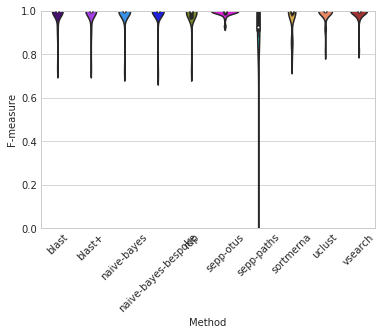

## gg_13_8_otus level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.92",0.747524,0.854652,0.983594,0.972504,0.977910
2,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.598975,0.810309,0.916211,0.911978,0.914045
4,rdp,0.1,0.595515,0.810801,0.915027,0.905077,0.909850
5,sepp-otus,otus:gg138,0.570450,0.608425,0.973278,0.845164,0.900749
0,blast,1000,0.563297,0.733910,0.946606,0.861232,0.900110
1,blast+,0.001:1:0.51:0.8,0.562788,0.733910,0.944754,0.861968,0.899571
8,uclust,0.51:0.9:3,0.557668,0.701251,0.963045,0.816100,0.876133
7,sortmerna,0.51:0.99:1:0.9:1.0,0.548289,0.708894,0.918700,0.822490,0.866213
9,vsearch,100:0.51:0.99,0.538568,0.687845,0.976327,0.796466,0.865343
6,sepp-paths,path:gg138,0.555815,0.587574,0.886213,0.792569,0.834116


stat         P     FDR P
Method A            Method B                                         
blast               blast+               1.717174  0.095320  0.285961
                    naive-bayes         -0.665329  0.510464  1.000000
                    naive-bayes-bespoke  0.000000  1.000000  1.000000
                    rdp                 -0.525334  0.602863  1.000000
                    sortmerna            2.506852  0.017284  0.079431
                    uclust               2.237150  0.032148  0.111283
                    vsearch              3.242201  0.002713  0.029156
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
blast+              naive-bayes         -0.691129  0.494318  1.000000
                    naive-bayes-bespoke  0.000000  1.000000  1.000000
                    rdp                 -0.554247  0.583147  1.000000
                    sortmerna            2.491211  0.017935  0.079431
                    uclust               2.178597  0.036607  0.117666
                    vsearch              3.175005  0.003240  0.029156
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
naive-bayes         naive-bayes-bespoke  0.000000  1.000000  1.000000
                    rdp                  0.773940  0.444476  1.000000
                    sortmerna            3.961134  0.000376  0.008452
                    uclust               2.535576  0.016146  0.079431
                    vsearch              2.871588  0.007082  0.045530
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
naive-bayes-bespoke rdp                  0.000000  1.000000  1.000000
                    sortmerna            0.000000  1.000000  1.000000
                    uclust               0.000000  1.000000  1.000000
                    vsearch              0.000000  1.000000  1.000000
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
rdp                 sortmerna            4.153561  0.000217  0.008452
                    uclust               2.922828  0.006221  0.045530
                    vsearch              3.380070  0.001876  0.028144
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
sortmerna           uclust              -0.982800  0.332857  0.936160
                    vsearch              0.073299  0.942010  1.000000
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
uclust              vsearch              2.323036  0.026487  0.099326
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
vsearch             sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
sepp-paths          sepp-otus           -2.531307  0.019416  0.079431

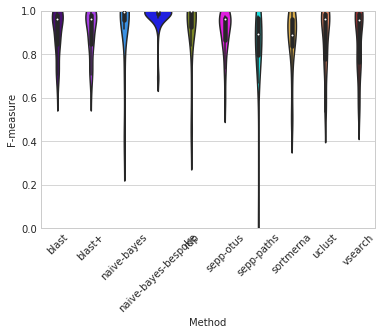

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.774533,0.829707,0.966365,0.913330,0.936868
0,blast,1000,0.473978,0.562493,0.742721,0.661915,0.696156
9,vsearch,1:0.75:0.97,0.480752,0.552090,0.725225,0.655916,0.686423
1,blast+,0.001:1:0.99:0.99,0.483883,0.534388,0.716598,0.623700,0.662533
8,uclust,0.51:0.9:1,0.482203,0.560375,0.720807,0.582836,0.633120
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.466330,0.600390,0.712715,0.469003,0.546463
4,rdp,0.4,0.435840,0.551868,0.716633,0.459564,0.541983
7,sortmerna,0.51:0.9:1:0.9:1.0,0.448676,0.527380,0.573458,0.506177,0.534869
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P     FDR P
Method A            Method B                                             
blast               blast+               1.823289  7.732932e-02  0.289985
                    naive-bayes          2.488057  1.806893e-02  0.108144
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  2.476429  1.857044e-02  0.108144
                    sortmerna            3.423245  1.669779e-03  0.035283
                    uclust               1.965619  5.780417e-02  0.276103
                    vsearch              0.532628  5.978600e-01  1.000000
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
blast+              naive-bayes          1.876848  6.940435e-02  0.283927
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  1.936915  6.135617e-02  0.276103
                    sortmerna            2.623907  1.306236e-02  0.108144
                    uclust               0.806157  4.259239e-01  1.000000
                    vsearch             -1.197252  2.397383e-01  0.634601
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  0.583283  5.636679e-01  1.000000
                    sortmerna            0.273734  7.859951e-01  1.000000
                    uclust              -1.621301  1.144705e-01  0.321948
                    vsearch             -2.469182  1.888945e-02  0.108144
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes-bespoke rdp                  0.000000  1.000000e+00  1.000000
                    sortmerna            0.000000  1.000000e+00  1.000000
                    uclust               0.000000  1.000000e+00  1.000000
                    vsearch              0.000000  1.000000e+00  1.000000
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
rdp                 sortmerna            0.162218  8.721234e-01  1.000000
                    uclust              -1.654211  1.075672e-01  0.321948
                    vsearch             -2.461666  1.922554e-02  0.108144
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sortmerna           uclust              -1.624555  1.137721e-01  0.321948
                    vsearch             -3.295776  2.352203e-03  0.035283
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
uclust              vsearch             -1.759594  8.774559e-02  0.303735
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sepp-paths          sepp-otus           -7.716839  1.460326e-07  0.000007

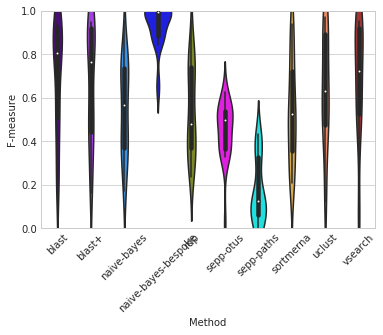

## gg_13_8_otus_clean level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.712322,0.911562,-1.0,-1.0,-1.0
1,rdp,0.0,0.699604,0.907037,-1.0,-1.0,-1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.712887,0.911562,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.707772,0.913824,-1.0,-1.0,-1.0
4,vsearch,100:0.51:0.8,0.607548,0.747399,-1.0,-1.0,-1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

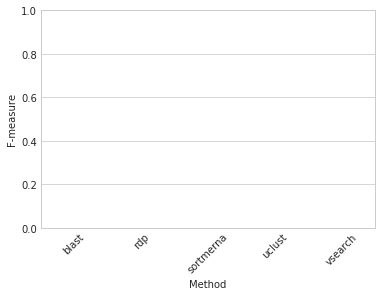

## gg_13_8_otus_clean level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.649330,0.792145,-1.0,-1.0,-1.0
1,rdp,0.0,0.632678,0.802214,-1.0,-1.0,-1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.652479,0.800676,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.644033,0.805322,-1.0,-1.0,-1.0
4,vsearch,100:0.51:0.8,0.388363,0.422378,-1.0,-1.0,-1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

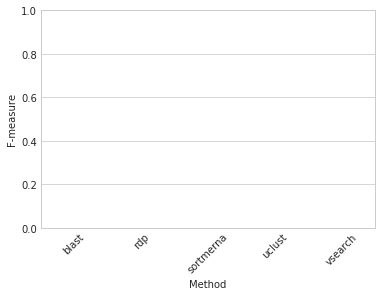

## gg_13_8_otus_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.325565,0.378819,-1.0,-1.0,-1.0
1,rdp,0.0,0.316955,0.400501,-1.0,-1.0,-1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.322731,0.377720,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.322748,0.388699,-1.0,-1.0,-1.0
4,vsearch,100:0.51:0.8,0.128230,0.130850,-1.0,-1.0,-1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

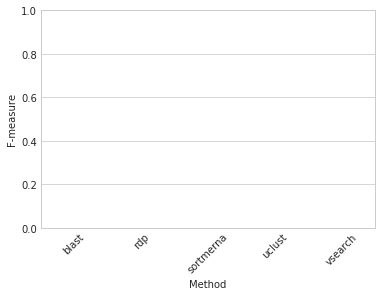

## unite_20.11.2016 level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,naive-bayes,0.8,0.555556,0.714286,0.746311,0.515057,0.609470
1,blast+,0.001:10:0.99:0.99,0.375000,0.428571,0.634662,0.337755,0.440694
5,vsearch,10:0.75:0.8,0.400000,0.571429,-0.151412,-0.328115,-0.269840
4,uclust,0.51:0.99:3,0.750000,0.428571,0.000000,-0.380031,-0.306842
0,blast,1000,0.381818,0.571429,-0.326156,-0.326156,-0.326156
3,sortmerna,1.0:0.9:5:0.9:1.0,0.236111,0.285714,-0.448390,-0.468682,-0.461051


stat         P     FDR P
Method A  Method B                                 
blast     sortmerna    2.234894  0.075698  0.234479
          uclust      -1.258076  0.263917  0.565537
          vsearch     -2.227170  0.076436  0.234479
          blast+       0.000000  1.000000  1.000000
          naive-bayes  0.000000  1.000000  1.000000
sortmerna uclust      -2.209440  0.078160  0.234479
          vsearch     -2.236053  0.075588  0.234479
          blast+       0.000000  1.000000  1.000000
          naive-bayes  0.000000  1.000000  1.000000
uclust    vsearch     -1.891227  0.117175  0.292938
          blast+       0.000000  1.000000  1.000000
          naive-bayes  0.000000  1.000000  1.000000
vsearch   blast+       0.000000  1.000000  1.000000
          naive-bayes  0.000000  1.000000  1.000000
blast+    naive-bayes -9.957224  0.009936  0.149040

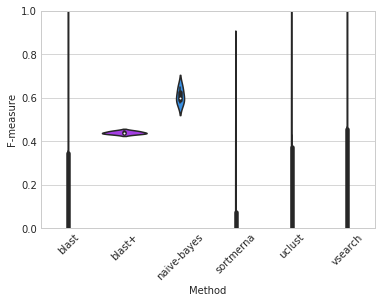

## unite_20.11.2016 level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,naive-bayes,0.8,0.272727,0.333333,0.660027,0.337755,0.446666
1,blast+,0.001:10:0.99:0.99,0.300000,0.333333,0.634662,0.337755,0.440694
5,vsearch,10:0.51:0.8,0.300000,0.303030,-0.165305,-0.328115,-0.272959
4,uclust,0.51:0.99:3,0.500000,0.202020,0.000000,-0.380031,-0.306842
0,blast,1000,0.348485,0.404040,-0.326156,-0.326156,-0.326156
3,sortmerna,1.0:0.9:5:0.9:1.0,0.118056,0.101010,-0.448390,-0.468682,-0.461051


stat         P     FDR P
Method A  Method B                                  
blast     sortmerna     2.234894  0.075698  0.234479
          uclust       -1.258076  0.263917  0.565537
          vsearch      -2.225033  0.076642  0.234479
          blast+        0.000000  1.000000  1.000000
          naive-bayes   0.000000  1.000000  1.000000
sortmerna uclust       -2.209440  0.078160  0.234479
          vsearch      -2.236038  0.075590  0.234479
          blast+        0.000000  1.000000  1.000000
          naive-bayes   0.000000  1.000000  1.000000
uclust    vsearch      -1.847277  0.123982  0.309955
          blast+        0.000000  1.000000  1.000000
          naive-bayes   0.000000  1.000000  1.000000
vsearch   blast+        0.000000  1.000000  1.000000
          naive-bayes   0.000000  1.000000  1.000000
blast+    naive-bayes -11.978930  0.006897  0.103453

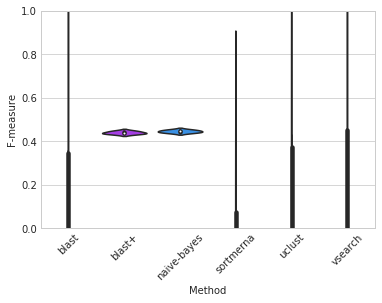

## unite_20.11.2016 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,naive-bayes,0.8,0.181818,0.166667,0.612712,0.275118,0.379565
1,blast+,0.001:10:0.99:0.99,0.181818,0.166667,0.586026,0.275118,0.374279
0,blast,1000,0.087121,0.083333,-0.500000,-0.500000,-0.500000
3,sortmerna,0.51:0.99:1:0.9:1.0,0.000000,0.000000,-0.500000,-0.500000,-0.500000
4,uclust,0.51:0.97:1,0.000000,0.000000,-0.500000,-0.500000,-0.500000
5,vsearch,100:0.51:0.8,0.000000,0.000000,-0.500000,-0.500000,-0.500000


stat         P  FDR P
Method A  Method B                               
blast     sortmerna          NaN       NaN    NaN
          uclust             NaN       NaN    NaN
          vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
sortmerna uclust             NaN       NaN    NaN
          vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
uclust    vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
vsearch   blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
blast+    naive-bayes -12.743173  0.006102    NaN

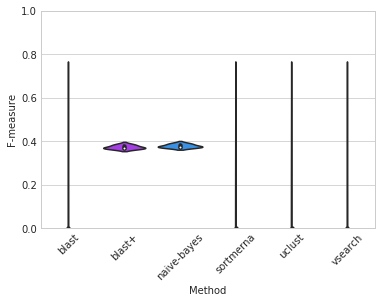

## unite_20.11.2016_clean level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.826389,1.000000,1.0,1.0,1.0
1,rdp,0.0,0.746843,1.000000,1.0,1.0,1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.609848,1.000000,1.0,1.0,1.0
3,uclust,0.51:0.8:1,0.777778,1.000000,1.0,1.0,1.0
4,vsearch,10:0.75:0.97,0.800000,0.571429,1.0,1.0,1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

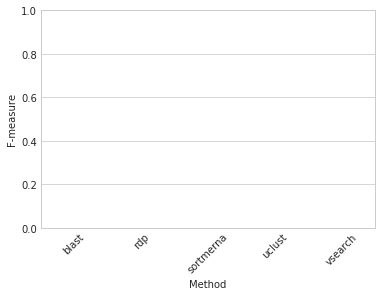

## unite_20.11.2016_clean level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.560897,0.777778,1.0,1.0,1.0
1,rdp,0.0,0.482251,0.666667,1.0,1.0,1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.483333,0.777778,1.0,1.0,1.0
3,uclust,0.51:0.8:1,0.583333,0.777778,1.0,1.0,1.0
4,vsearch,10:0.75:0.97,0.500000,0.333333,1.0,1.0,1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

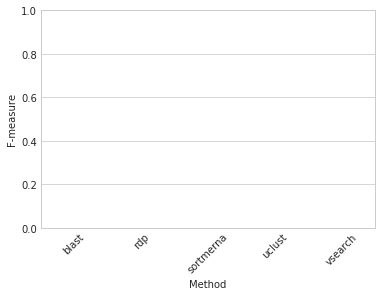

## unite_20.11.2016_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.160256,0.166667,0.0,0.0,0.0
1,rdp,0.0,0.148611,0.166667,0.0,0.0,0.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.129167,0.166667,0.0,0.0,0.0
3,uclust,0.51:0.8:1,0.153846,0.166667,0.0,0.0,0.0
4,vsearch,100:0.51:0.8,0.174242,0.166667,0.0,0.0,0.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

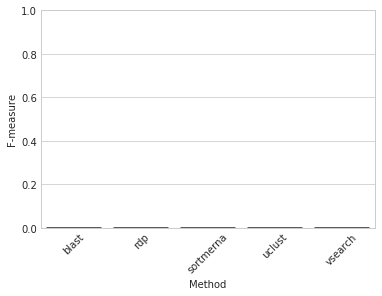

## unite_20.11.2016_clean_fullITS level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.809098,0.651515,0.980761,0.980761,0.980761
4,rdp,0.0,0.789574,0.651515,0.960221,0.960221,0.960221
7,vsearch,10:0.75:0.97,0.743008,0.596104,0.959836,0.959692,0.959764
2,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.773400,0.651515,0.956760,0.956760,0.956760
5,sortmerna,0.51:0.99:5:0.9:1.0,0.761717,0.595671,0.977417,0.940784,0.954508
1,blast+,0.001:1:0.99:0.97,0.774750,0.632468,0.959038,0.946395,0.950863
0,blast,1000,0.798823,0.646753,0.948571,0.948571,0.948571
6,uclust,1.0:0.9:1,0.712032,0.576190,0.947080,0.936762,0.941497


stat         P     FDR P
Method A            Method B                                         
blast               blast+              -0.752410  0.454796  0.489780
                    naive-bayes         -0.849953  0.398787  0.465252
                    naive-bayes-bespoke -2.633837  0.010764  0.046395
                    rdp                 -1.236187  0.221288  0.295050
                    sortmerna           -2.086446  0.041270  0.096296
                    uclust               2.434591  0.017953  0.047029
                    vsearch             -1.186895  0.240026  0.305488
blast+              naive-bayes         -0.886143  0.379138  0.461559
                    naive-bayes-bespoke -2.797052  0.006953  0.046395
                    rdp                 -1.440366  0.155050  0.228494
                    sortmerna           -1.781294  0.080012  0.131784
                    uclust               2.527337  0.014193  0.046395
                    vsearch             -1.372176  0.175203  0.245285
naive-bayes         naive-bayes-bespoke -2.507979  0.014913  0.046395
                    rdp                 -1.887208  0.064055  0.122480
                    sortmerna            0.285541  0.776230  0.776230
                    uclust               1.606279  0.113552  0.176637
                    vsearch             -1.806209  0.075987  0.131784
naive-bayes-bespoke rdp                  2.548515  0.013441  0.046395
                    sortmerna            2.579915  0.012393  0.046395
                    uclust               2.766456  0.007555  0.046395
                    vsearch              2.547598  0.013473  0.046395
rdp                 sortmerna            0.771849  0.443284  0.489780
                    uclust               1.913178  0.060582  0.122480
                    vsearch              2.423102  0.018476  0.047029
sortmerna           uclust               2.831662  0.006324  0.046395
                    vsearch             -0.707335  0.482143  0.500000
uclust              vsearch             -1.875935  0.065614  0.122480

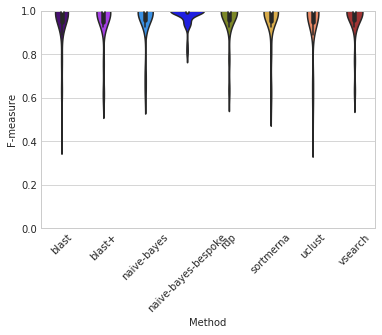

## unite_20.11.2016_clean_fullITS level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.808477,0.651515,0.980761,0.980761,0.980761
7,vsearch,1:0.99:0.97,0.746215,0.587311,0.959836,0.959692,0.959764
4,rdp,0.5,0.773282,0.633333,0.959578,0.958044,0.958803
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.763215,0.624242,0.954584,0.954584,0.954584
5,sortmerna,0.51:0.99:5:0.9:1.0,0.774605,0.600379,0.977417,0.940784,0.954508
1,blast+,0.001:1:0.99:0.97,0.777198,0.629167,0.959038,0.946395,0.950863
0,blast,1000,0.776279,0.629167,0.946395,0.946395,0.946395
6,uclust,0.76:0.9:1,0.693428,0.546212,0.944516,0.934585,0.939143


stat         P     FDR P
Method A            Method B                                         
blast               blast+              -1.507701  0.136967  0.201847
                    naive-bayes         -0.849953  0.398787  0.465252
                    naive-bayes-bespoke -2.689232  0.009297  0.038562
                    rdp                 -1.317165  0.192876  0.245479
                    sortmerna           -2.567079  0.012812  0.038562
                    uclust               2.438769  0.017766  0.041453
                    vsearch             -1.417988  0.161454  0.226036
blast+              naive-bayes         -0.544627  0.588063  0.609843
                    naive-bayes-bespoke -2.797052  0.006953  0.038562
                    rdp                 -1.224818  0.225511  0.274536
                    sortmerna           -1.781294  0.080012  0.131784
                    uclust               2.727264  0.008398  0.038562
                    vsearch             -1.372176  0.175203  0.233604
naive-bayes         naive-bayes-bespoke -2.514090  0.014682  0.038562
                    rdp                 -2.016014  0.048359  0.090137
                    sortmerna            0.009338  0.992581  0.992581
                    uclust               1.623498  0.109814  0.170823
                    vsearch             -2.185763  0.032814  0.070676
naive-bayes-bespoke rdp                  2.550274  0.013380  0.038562
                    sortmerna            2.579915  0.012393  0.038562
                    uclust               2.794623  0.006999  0.038562
                    vsearch              2.547598  0.013473  0.038562
rdp                 sortmerna            0.573372  0.568572  0.609843
                    uclust               1.987571  0.051507  0.090137
                    vsearch             -2.501809  0.015149  0.038562
sortmerna           uclust               2.882010  0.005503  0.038562
                    vsearch             -0.707335  0.482143  0.540000
uclust              vsearch             -2.061648  0.043655  0.087311

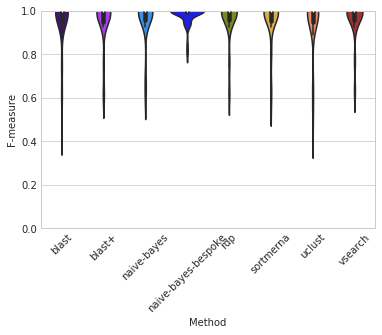

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.94",0.669836,0.546032,0.972887,0.929592,0.944469
5,sortmerna,1.0:0.99:5:0.9:1.0,0.660981,0.536174,0.971687,0.916463,0.933322
4,rdp,0.6,0.653354,0.559848,0.942793,0.917874,0.927453
1,blast+,0.001:1:0.99:0.99,0.671091,0.543561,0.932220,0.916338,0.921908
7,vsearch,1:0.75:0.9,0.655308,0.555682,0.926034,0.917874,0.921564
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.613631,0.503409,0.936461,0.871684,0.897491
0,blast,1000,0.570511,0.483712,0.857675,0.857675,0.857675
6,uclust,0.51:0.9:1,0.471747,0.387121,0.854546,0.849717,0.851932


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -7.606948  2.533318e-10  1.182215e-09
                    naive-bayes         -3.529709  8.137442e-04  1.627488e-03
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                 -7.642883  2.201841e-10  1.182215e-09
                    sortmerna           -7.084746  1.944248e-09  6.804867e-09
                    uclust               2.472737  1.630922e-02  2.686224e-02
                    vsearch             -7.270945  9.403240e-10  3.761296e-09
blast+              naive-bayes          4.559038  2.641933e-05  7.397413e-05
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                 -2.809092  6.727757e-03  1.255848e-02
                    sortmerna           -2.265082  2.719421e-02  4.230210e-02
                    uclust               8.505414  7.687258e-12  1.362573e-10
                    vsearch              0.143413  8.864525e-01  1.000000e+00
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                 -5.020665  5.053494e-06  1.572198e-05
                    sortmerna           -4.284749  6.847673e-05  1.597790e-04
                    uclust               4.349981  5.472237e-05  1.392933e-04
                    vsearch             -3.673821  5.169163e-04  1.113358e-03
naive-bayes-bespoke rdp                  0.000000  1.000000e+00  1.000000e+00
                    sortmerna            0.000000  1.000000e+00  1.000000e+00
                    uclust               0.000000  1.000000e+00  1.000000e+00
                    vsearch              0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna           -1.685223  9.722832e-02  1.361196e-01
                    uclust               8.444487  9.732667e-12  1.362573e-10
                    vsearch              1.936669  5.757956e-02  8.485409e-02
sortmerna           uclust               7.616353  2.442020e-10  1.182215e-09
                    vsearch              2.672039  9.731344e-03  1.702985e-02
uclust              vsearch             -8.081083  3.990831e-11  3.724776e-10

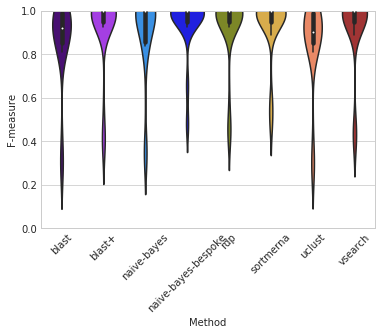

## gg_13_8_otus_clean_full16S level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:1:0.51:0.8,0.0,0.0,0.965083,0.965083,0.965083
2,rdp,0.0,0.0,0.0,0.965083,0.965083,0.965083
3,uclust,1.0:0.9:5,0.0,0.0,0.965083,0.965083,0.965083
4,vsearch,1:0.51:0.8,0.0,0.0,0.965083,0.965083,0.965083
1,naive-bayes,0.5,0.0,0.0,1.000000,0.930670,0.963361


stat         P  FDR P
Method A Method B                              
rdp      uclust            NaN       NaN    NaN
         vsearch           NaN       NaN    NaN
         blast+            NaN       NaN    NaN
         naive-bayes  0.047384  0.965185    NaN
uclust   vsearch           NaN       NaN    NaN
         blast+            NaN       NaN    NaN
         naive-bayes  0.047384  0.965185    NaN
vsearch  blast+            NaN       NaN    NaN
         naive-bayes  0.047384  0.965185    NaN
blast+   naive-bayes  0.047384  0.965185    NaN

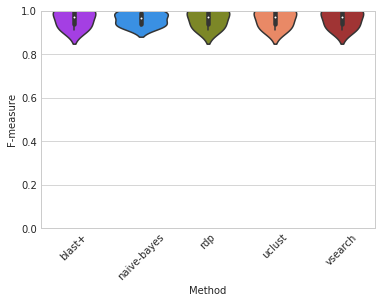

## gg_13_8_otus_clean_full16S level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:1:0.51:0.8,0.0,0.0,0.965083,0.965083,0.965083
2,rdp,0.0,0.0,0.0,0.965083,0.965083,0.965083
3,uclust,1.0:0.9:1,0.0,0.0,0.965083,0.965083,0.965083
4,vsearch,1:0.51:0.8,0.0,0.0,0.965083,0.965083,0.965083
1,naive-bayes,0.5,0.0,0.0,1.000000,0.914483,0.954944


stat         P  FDR P
Method A Method B                              
rdp      uclust            NaN       NaN    NaN
         vsearch           NaN       NaN    NaN
         blast+            NaN       NaN    NaN
         naive-bayes  0.316472  0.772387    NaN
uclust   vsearch           NaN       NaN    NaN
         blast+            NaN       NaN    NaN
         naive-bayes  0.316472  0.772387    NaN
vsearch  blast+            NaN       NaN    NaN
         naive-bayes  0.316472  0.772387    NaN
blast+   naive-bayes  0.316472  0.772387    NaN

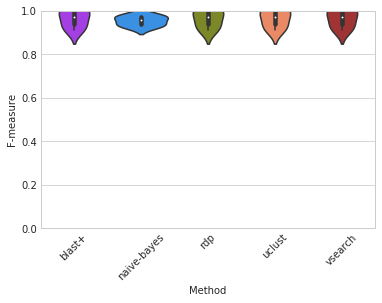

## gg_13_8_otus_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,uclust,0.51:0.99:3,0.0,0.0,0.918073,0.708025,0.798342
0,blast+,0.001:1:0.51:0.99,0.0,0.0,0.899145,0.708025,0.791578
1,naive-bayes,0.5,0.0,0.0,0.641560,0.157699,0.249845
2,rdp,0.9,0.0,0.0,0.523258,0.103136,0.171456
4,vsearch,10:0.51:0.97,0.0,0.0,0.104260,0.103136,0.103690


stat         P     FDR P
Method A Method B                                   
rdp      uclust      -106.504483  0.000002  0.000018
         vsearch        3.694238  0.034415  0.043019
         blast+       -78.921689  0.000004  0.000022
         naive-bayes   -2.373096  0.098229  0.109143
uclust   vsearch       32.761575  0.000063  0.000208
         blast+         1.929034  0.149308  0.149308
         naive-bayes   14.924967  0.000653  0.001306
vsearch  blast+       -27.965900  0.000100  0.000251
         naive-bayes   -9.129670  0.002778  0.003968
blast+   naive-bayes   13.544852  0.000870  0.001451

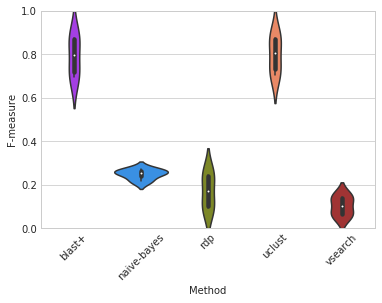

## gg_13_8_otus_clean_trim150 level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.897634,0.805556,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.926042,0.708333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

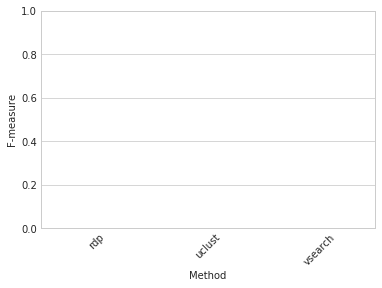

## gg_13_8_otus_clean_trim150 level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.834158,0.750000,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.926042,0.708333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

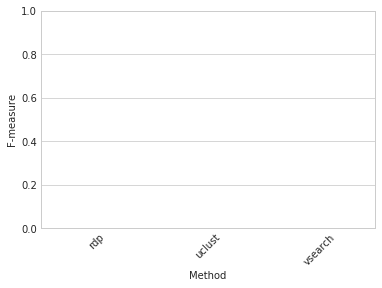

## gg_13_8_otus_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.304800,0.25,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.00,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.425858,0.30,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

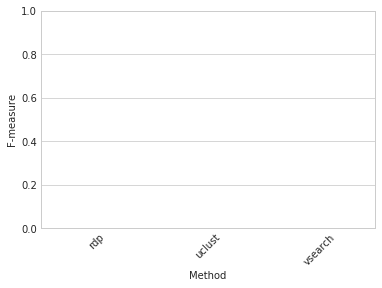

## gg_13_8_otus_full16S level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.958978,0.805556,1.0,1.0,1.0
1,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.971405,0.805556,1.0,1.0,1.0


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,NaN,NaN,NaN


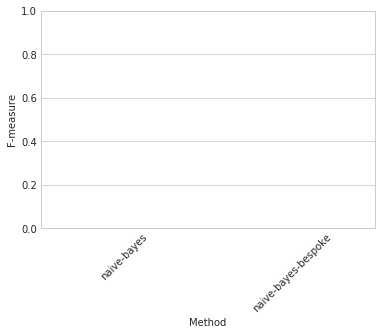

## gg_13_8_otus_full16S level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.971405,0.805556,1.0,1.0,1.0
1,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.971405,0.805556,1.0,1.0,1.0


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,NaN,NaN,NaN


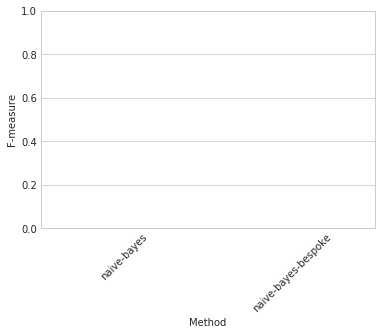

## gg_13_8_otus_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.0",0.973611,0.7875,1.000000,1.00000,1.000000
0,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.636151,0.5500,0.886045,0.86079,0.873227


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,-2.781577,0.0689,0.0689


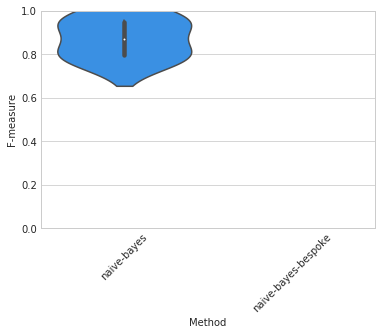

## silva_123_clean_full16S level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0
1,naive-bayes,0.5,1.000000,0.833333,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.918914,0.777778,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

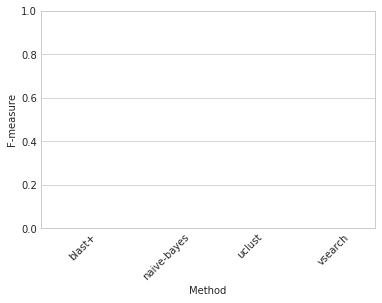

## silva_123_clean_full16S level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0
1,naive-bayes,0.5,1.000000,0.833333,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.918914,0.777778,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

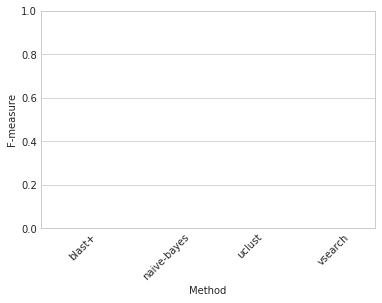

## silva_123_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.276641,0.214286,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.350376,0.273810,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.363849,0.297619,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.402133,0.309524,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

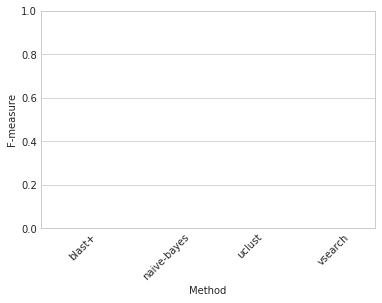

## silva_123_clean_v4_trim250 level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.97:1,0.986842,0.833333,-1.0,-1.0,-1.0
1,vsearch,10:0.51:0.97,0.986842,0.833333,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,NaN,NaN,NaN


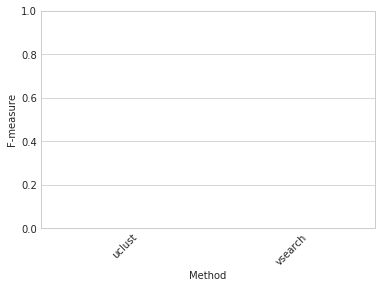

## silva_123_clean_v4_trim250 level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.97:1,0.986842,0.833333,-1.0,-1.0,-1.0
1,vsearch,10:0.51:0.97,0.986842,0.833333,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,NaN,NaN,NaN


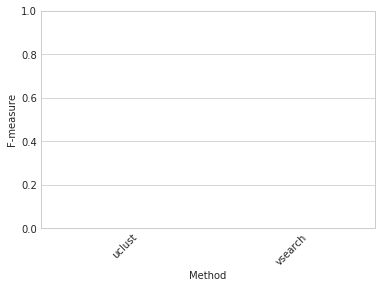

## silva_123_clean_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.97:1,0.298390,0.226190,-1.0,-1.0,-1.0
1,vsearch,10:0.51:0.97,0.335816,0.261905,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,NaN,NaN,NaN


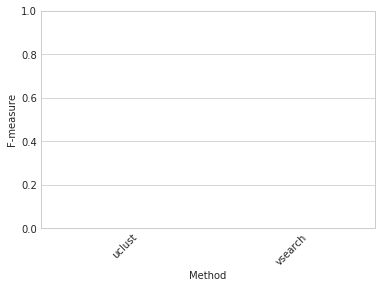

## silva_123_v4_trim250 level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0
1,naive-bayes,0.5,1.000000,0.833333,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.918914,0.777778,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

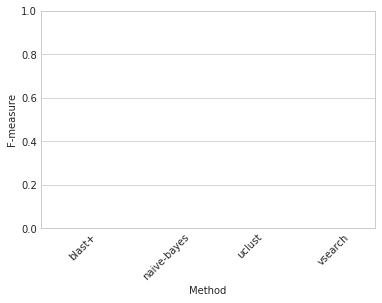

## silva_123_v4_trim250 level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0
1,naive-bayes,0.5,1.000000,0.833333,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.918914,0.777778,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,1.000000,0.833333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

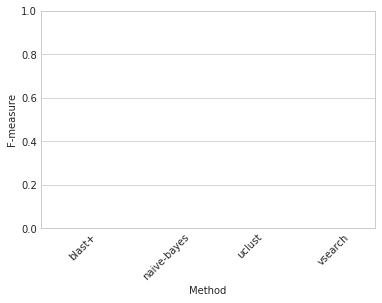

## silva_123_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.064135,0.047619,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.484109,0.369048,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.389724,0.309524,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.188237,0.142857,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

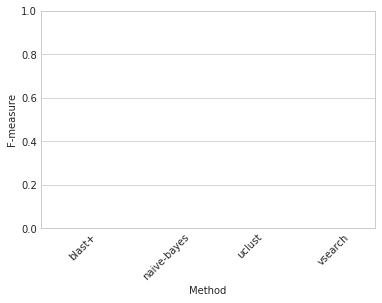

## unite_20.11.2016_clean_trim100 level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.450549,0.857143,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.571429,0.571429,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

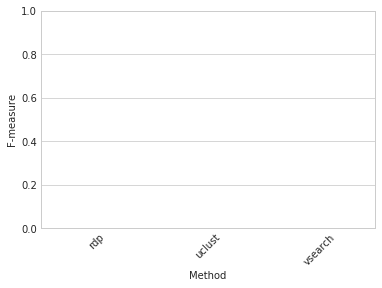

## unite_20.11.2016_clean_trim100 level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.346405,0.666667,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.500000,0.444444,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

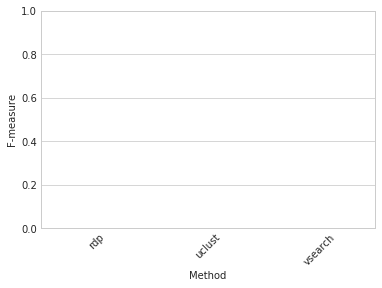

## unite_20.11.2016_clean_trim100 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.163743,0.250000,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.125000,0.083333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

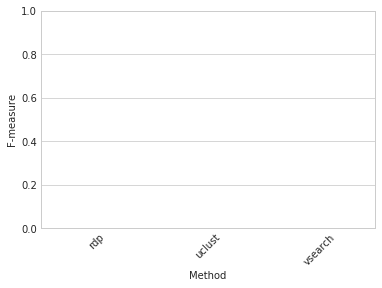

## unite_20.11.2016_clean_trim150 level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.639899,1.0,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


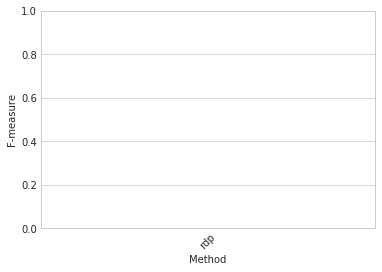

## unite_20.11.2016_clean_trim150 level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.419048,0.666667,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


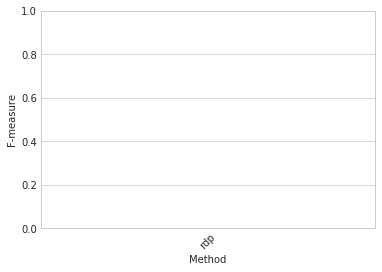

## unite_20.11.2016_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.130556,0.166667,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


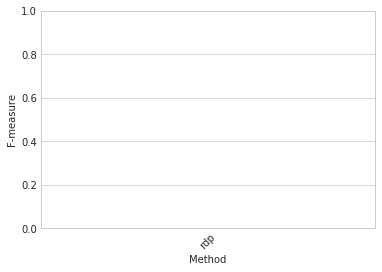

In [57]:
boxes = rank_optimized_method_performance_by_dataset(mock_results,
                                                     dataset="Reference",
                                                     metric="F-measure",
                                                     level_range=range(4,7),
                                                     display_fields=["Method",
                                                                     "Parameters",
                                                                     "Taxon Accuracy Rate",
                                                                     "Taxon Detection Rate",
                                                                     "Precision",
                                                                     "Recall",
                                                                     "F-measure"],
                                                     paired=True,
                                                     parametric=True,
                                                     color=None,
                                                     color_palette=color_palette)

In [ ]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-fmeasure-{0}-boxplots.pdf'.format(k)))

## Taxon Accuracy Rate

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.0",0.927823,0.597525,0.516160,0.425484,0.458826
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
9,vsearch,1:0.99:0.99,0.485278,0.552090,0.724569,0.654826,0.685500
1,blast+,0.001:1:0.99:0.99,0.483883,0.534388,0.716598,0.623700,0.662533
8,uclust,0.76:0.9:1,0.482203,0.560375,0.720807,0.582836,0.633120
0,blast,1e-10,0.474202,0.562493,0.742721,0.661915,0.696156
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.466330,0.600390,0.712715,0.469003,0.546463
7,sortmerna,0.51:0.99:1:0.9:1.0,0.458477,0.525202,0.574611,0.504995,0.534675
4,rdp,0.2,0.439167,0.569307,0.702718,0.461538,0.537702
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                  
blast               blast+               -1.769286  8.608791e-02  3.521778e-01
                    naive-bayes           0.510577  6.130463e-01  1.000000e+00
                    naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                   2.414360  2.146935e-02  9.661209e-02
                    sortmerna             3.029622  4.731961e-03  3.434250e-02
                    uclust               -0.744236  4.620009e-01  1.000000e+00
                    vsearch              -1.455048  1.551032e-01  5.816370e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes           0.983860  3.323431e-01  9.347151e-01
                    naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                   2.648917  1.229385e-02  6.915290e-02
                    sortmerna             4.808094  3.243597e-05  4.865395e-04
                    uclust                0.137054  8.918205e-01  1.000000e+00
                    vsearch              -0.160644  8.733530e-01  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                   6.261247  4.481216e-07  1.008274e-05
                    sortmerna             0.489473  6.277452e-01  1.000000e+00
                    uclust               -0.995220  3.268714e-01  9.347151e-01
                    vsearch              -1.295266  2.042167e-01  6.603081e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                   0.000000  1.000000e+00  1.000000e+00
                    sortmerna             0.000000  1.000000e+00  1.000000e+00
                    uclust                0.000000  1.000000e+00  1.000000e+00
                    vsearch               0.000000  1.000000e+00  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna            -1.291717  2.054292e-01  6.603081e-01
                    uclust               -2.982471  5.342167e-03  3.434250e-02
                    vsearch              -3.164164  3.333201e-03  2.999881e-02
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust               -2.417004  2.133794e-02  9.661209e-02
                    vsearch              -3.651012  8.951957e-04  1.007095e-02
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
uclust              vsearch              -0.375179  7.099278e-01  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -23.601334  1.336190e-16  6.012853e-15

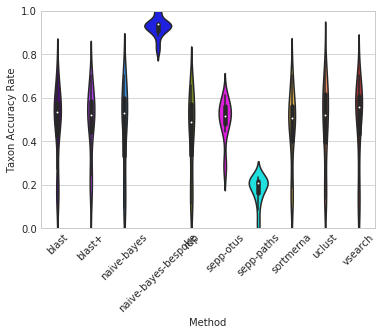

## gg_13_8_otus_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
4,vsearch,1:0.99:0.99,0.450931,0.370604,-1.0,-1.0,-1.0
0,blast,1e-10,0.325897,0.378819,-1.0,-1.0,-1.0
2,sortmerna,0.76:0.9:1:0.8:1.0,0.325372,0.377720,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.322748,0.388699,-1.0,-1.0,-1.0
1,rdp,0.0,0.316955,0.400501,-1.0,-1.0,-1.0


stat             P         FDR P
Method A  Method B                                       
blast     rdp        3.015027  5.823887e-03  9.706479e-03
          sortmerna  0.246707  8.071495e-01  8.071495e-01
          uclust     1.766940  8.944614e-02  1.277802e-01
          vsearch   -7.289647  1.225958e-07  3.064896e-07
rdp       sortmerna -3.106467  4.668638e-03  9.337276e-03
          uclust    -1.483156  1.505310e-01  1.881638e-01
          vsearch   -7.800577  3.711395e-08  2.923977e-07
sortmerna uclust     0.904897  3.741582e-01  4.157313e-01
          vsearch   -7.492538  7.596959e-08  2.923977e-07
uclust    vsearch   -7.431332  8.771930e-08  2.923977e-07

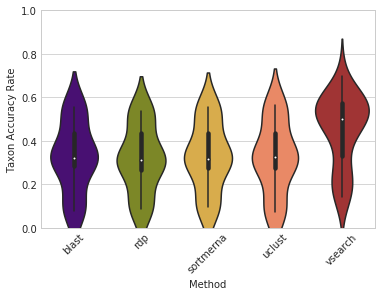

## unite_20.11.2016 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
5,vsearch,1:0.51:0.9,0.200000,0.083333,-0.500000,-0.500000,-0.500000
1,blast+,0.001:10:0.99:0.99,0.181818,0.166667,0.586026,0.275118,0.374279
2,naive-bayes,0.8,0.181818,0.166667,0.612712,0.275118,0.379565
4,uclust,1.0:0.9:1,0.166667,0.083333,-0.500000,-0.500000,-0.500000
3,sortmerna,0.51:0.9:1:0.9:1.0,0.090909,0.083333,-0.500000,-0.500000,-0.500000
0,blast,1000,0.087121,0.083333,-0.500000,-0.500000,-0.500000


/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/statsmodels/stats/multitest.py:320: RuntimeWarning: invalid value encountered in less_equal
  reject = pvals_sorted <= ecdffactor*alpha


stat             P  FDR P
Method A  Method B                                   
blast     sortmerna    -2.236068  7.558682e-02    NaN
          uclust      -46.957428  8.273217e-08    NaN
          vsearch     -66.634826  1.441286e-08    NaN
          blast+        0.000000  1.000000e+00    NaN
          naive-bayes   0.000000  1.000000e+00    NaN
sortmerna uclust            -inf  0.000000e+00    NaN
          vsearch           -inf  0.000000e+00    NaN
          blast+        0.000000  1.000000e+00    NaN
          naive-bayes   0.000000  1.000000e+00    NaN
uclust    vsearch           -inf  0.000000e+00    NaN
          blast+        0.000000  1.000000e+00    NaN
          naive-bayes   0.000000  1.000000e+00    NaN
vsearch   blast+        0.000000  1.000000e+00    NaN
          naive-bayes   0.000000  1.000000e+00    NaN
blast+    naive-bayes        NaN           NaN    NaN

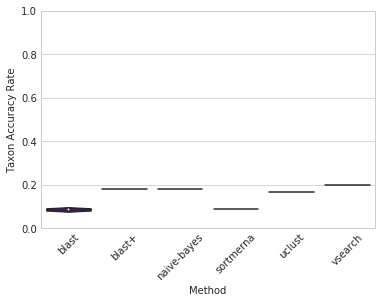

## unite_20.11.2016_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
4,vsearch,100:0.51:0.9,0.272727,0.250000,0.0,0.0,0.0
3,uclust,0.76:0.9:1,0.222222,0.166667,0.0,0.0,0.0
1,rdp,0.9,0.174242,0.166667,0.0,0.0,0.0
0,blast,0.001,0.160256,0.166667,0.0,0.0,0.0
2,sortmerna,0.76:0.9:1:0.8:1.0,0.153846,0.166667,0.0,0.0,0.0


stat             P         FDR P
Method A  Method B                                        
blast     rdp        -2.236068  7.558682e-02  7.558682e-02
          sortmerna   2.236068  7.558682e-02  7.558682e-02
          uclust    -21.615324  3.931762e-06  6.552936e-06
          vsearch   -39.232829  2.027857e-07  5.069643e-07
rdp       sortmerna   6.020183  1.818592e-03  2.273240e-03
          uclust    -14.161764  3.160759e-05  4.515369e-05
          vsearch   -29.068884  9.029654e-07  1.805931e-06
sortmerna uclust          -inf  0.000000e+00  0.000000e+00
          vsearch         -inf  0.000000e+00  0.000000e+00
uclust    vsearch         -inf  0.000000e+00  0.000000e+00

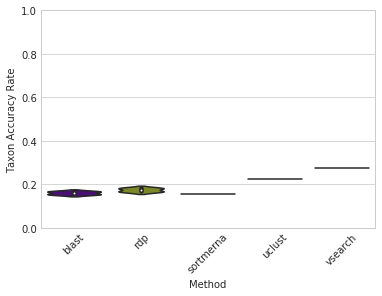

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.0",0.864407,0.240370,0.592765,0.592765,0.592765
1,blast+,0.001:1:0.99:0.99,0.671091,0.543561,0.932220,0.916338,0.921908
5,sortmerna,0.51:0.99:1:0.9:1.0,0.666263,0.525758,0.926552,0.907585,0.914420
4,rdp,0.3,0.656641,0.559848,0.917874,0.917874,0.917874
7,vsearch,1:0.75:0.9,0.655308,0.555682,0.926034,0.917874,0.921564
2,naive-bayes,"0.001:char:8192:[16,16]:0.7",0.625987,0.516667,0.897972,0.892073,0.894511
0,blast,1000,0.570511,0.483712,0.857675,0.857675,0.857675
6,uclust,0.76:0.99:3,0.539127,0.291288,0.941494,0.432743,0.526520


stat             P         FDR P
Method A            Method B                                                  
blast               blast+              -11.154588  3.662303e-16  2.050890e-15
                    naive-bayes          -4.024202  1.651266e-04  4.623545e-04
                    naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                 -14.822992  1.486126e-21  4.161153e-20
                    sortmerna           -10.619574  2.577424e-15  1.202798e-14
                    uclust                2.675295  9.647650e-03  2.077955e-02
                    vsearch             -14.224102  1.003413e-20  1.404778e-19
blast+              naive-bayes           3.088983  3.060927e-03  7.791451e-03
                    naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                   1.969362  5.361290e-02  8.830360e-02
                    sortmerna             1.023874  3.100745e-01  4.341043e-01
                    uclust               12.404572  4.395577e-18  4.102539e-17
                    vsearch               2.085589  4.135004e-02  7.236256e-02
naive-bayes         naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                  -2.447658  1.737359e-02  3.243069e-02
                    sortmerna            -2.988374  4.083143e-03  9.527333e-03
                    uclust                4.729243  1.445691e-05  4.497706e-05
                    vsearch              -2.456123  1.700752e-02  3.243069e-02
naive-bayes-bespoke rdp                   0.000000  1.000000e+00  1.000000e+00
                    sortmerna             0.000000  1.000000e+00  1.000000e+00
                    uclust                0.000000  1.000000e+00  1.000000e+00
                    vsearch               0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna            -1.414031  1.626082e-01  2.396331e-01
                    uclust                9.972981  2.845486e-14  1.138194e-13
                    vsearch               0.904465  3.694276e-01  4.925701e-01
sortmerna           uclust               11.951518  2.134799e-17  1.494359e-16
                    vsearch               1.563253  1.233414e-01  1.918643e-01
uclust              vsearch              -9.669166  8.929049e-14  3.125167e-13

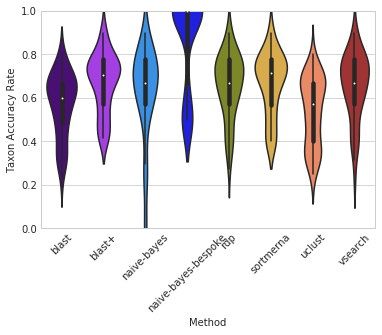

## gg_13_8_otus_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.0,0.0,0.154182,0.046984,0.071758
1,naive-bayes,0.5,0.0,0.0,0.641560,0.157699,0.249845
2,rdp,0.0,0.0,0.0,0.132128,0.132128,0.132128
3,uclust,0.51:0.97:1,0.0,0.0,0.792689,0.693876,0.739772
4,vsearch,10:0.51:0.8,0.0,0.0,0.055153,0.046984,0.050681


stat   P  FDR P
Method A Method B                    
rdp      uclust        NaN NaN    NaN
         vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

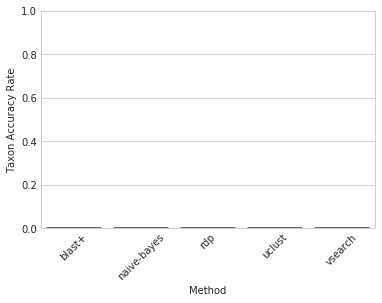

## gg_13_8_otus_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,vsearch,10:0.51:0.99,0.515385,0.30,-1.0,-1.0,-1.0
0,rdp,0.0,0.304800,0.25,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.00,-1.0,-1.0,-1.0


stat         P     FDR P
Method A Method B                               
rdp      uclust    11.234401  0.001512  0.001512
         vsearch  -51.663150  0.000016  0.000048
uclust   vsearch  -17.396241  0.000414  0.000621

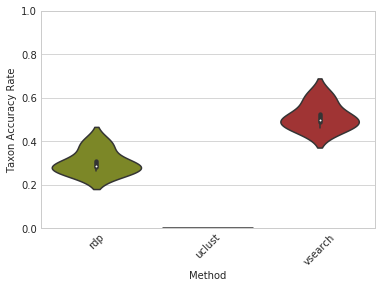

## gg_13_8_otus_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.0",1.000000,0.225,0.099511,0.099511,0.099511
0,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.643727,0.525,0.885691,0.860448,0.872879


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,-33.348198,0.000059,0.000059


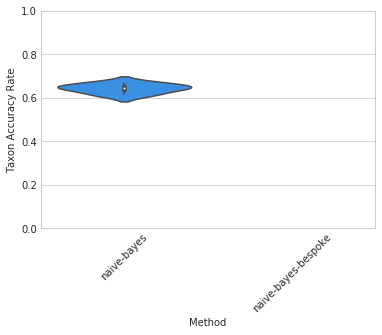

## silva_123_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,uclust,0.51:0.9:5,0.527624,0.404762,-1.0,-1.0,-1.0
3,vsearch,1:0.51:0.97,0.467322,0.369048,-1.0,-1.0,-1.0
1,naive-bayes,0.8,0.355046,0.273810,-1.0,-1.0,-1.0
0,blast+,0.001:1:0.51:0.8,0.341768,0.250000,-1.0,-1.0,-1.0


stat         P     FDR P
Method A Method B                                  
uclust   vsearch       1.888206  0.155430  0.186516
         blast+        5.442794  0.012179  0.029977
         naive-bayes  12.267751  0.001166  0.006999
vsearch  blast+        3.761129  0.032865  0.049297
         naive-bayes   5.048714  0.014988  0.029977
blast+   naive-bayes  -0.345756  0.752352  0.752352

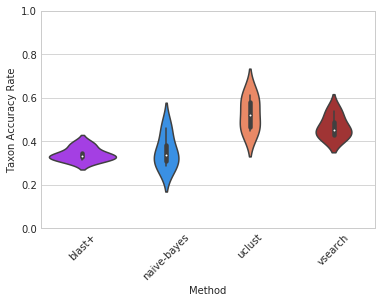

## silva_123_clean_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.99:3,0.554198,0.440476,-1.0,-1.0,-1.0
1,vsearch,1:0.51:0.97,0.463996,0.357143,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,2.759545,0.070179,0.070179


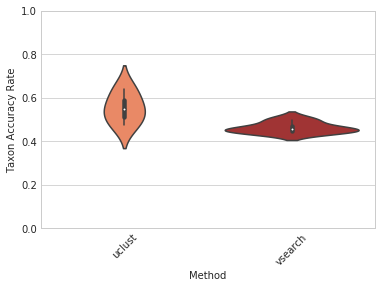

## silva_123_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,naive-bayes,0.5,0.484109,0.369048,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.389724,0.309524,-1.0,-1.0,-1.0
3,vsearch,1:0.51:0.8,0.351887,0.273810,-1.0,-1.0,-1.0
0,blast+,0.001:1:0.51:0.8,0.091181,0.071429,-1.0,-1.0,-1.0


stat         P     FDR P
Method A Method B                                  
uclust   vsearch       1.986092  0.141219  0.141219
         blast+        9.098172  0.002806  0.008417
         naive-bayes  -3.038148  0.055949  0.067139
vsearch  blast+       11.444400  0.001432  0.008417
         naive-bayes  -3.481154  0.040022  0.060033
blast+   naive-bayes  -6.894291  0.006252  0.012505

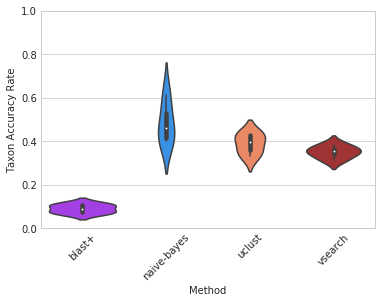

## unite_20.11.2016_clean_trim100 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.3,0.195833,0.250000,-1.0,-1.0,-1.0
1,uclust,1.0:0.9:5,0.166667,0.083333,-1.0,-1.0,-1.0
2,vsearch,10:0.99:0.99,0.142857,0.083333,-1.0,-1.0,-1.0


stat         P     FDR P
Method A Method B                               
rdp      uclust     7.000000  0.019804  0.019804
         vsearch   12.714286  0.006129  0.009194
uclust   vsearch         inf  0.000000  0.000000

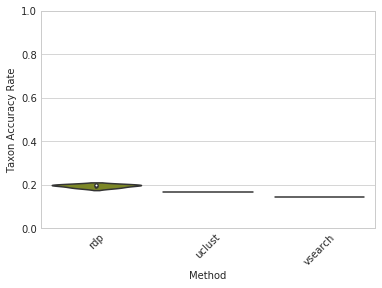

## unite_20.11.2016_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.9,0.181818,0.166667,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


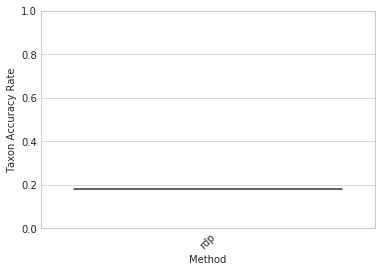

## Taxon Detection Rate

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.5",0.779585,0.843331,0.802810,0.747975,0.772246
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.466330,0.600390,0.712715,0.469003,0.546463
4,rdp,0.0,0.431047,0.574165,0.699703,0.461855,0.536856
0,blast,1000,0.473978,0.562493,0.742721,0.661915,0.696156
8,uclust,0.76:0.9:1,0.482203,0.560375,0.720807,0.582836,0.633120
9,vsearch,1:0.75:0.9,0.482258,0.555032,0.724588,0.656009,0.686290
1,blast+,0.001:1:0.51:0.8,0.467784,0.537493,0.701426,0.624891,0.657060
7,sortmerna,0.51:0.9:1:0.9:1.0,0.448676,0.527380,0.573458,0.506177,0.534869
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                  
blast               blast+                1.670642  1.042517e-01  3.608711e-01
                    naive-bayes          -2.407358  2.182105e-02  8.926793e-02
                    naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                  -0.784924  4.380971e-01  1.000000e+00
                    sortmerna             5.740770  2.070645e-06  4.658952e-05
                    uclust                0.213755  8.320534e-01  1.000000e+00
                    vsearch               0.841701  4.060137e-01  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes          -3.440991  1.591404e-03  1.193553e-02
                    naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                  -1.955672  5.901430e-02  2.213036e-01
                    sortmerna             0.701859  4.876877e-01  1.000000e+00
                    uclust               -1.189800  2.426151e-01  7.278454e-01
                    vsearch              -1.043297  3.043937e-01  8.561074e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke   0.000000  1.000000e+00  1.000000e+00
                    rdp                   4.238955  1.699282e-04  1.911692e-03
                    sortmerna             4.660615  4.996835e-05  7.495253e-04
                    uclust                2.421996  2.109175e-02  8.926793e-02
                    vsearch               3.314353  2.238296e-03  1.259041e-02
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                   0.000000  1.000000e+00  1.000000e+00
                    sortmerna             0.000000  1.000000e+00  1.000000e+00
                    uclust                0.000000  1.000000e+00  1.000000e+00
                    vsearch               0.000000  1.000000e+00  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna             3.222292  2.859534e-03  1.429767e-02
                    uclust                0.938309  3.549028e-01  9.394486e-01
                    vsearch               1.330980  1.923189e-01  6.181678e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust               -3.322980  2.187206e-03  1.259041e-02
                    vsearch              -4.028149  3.105950e-04  2.795355e-03
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
uclust              vsearch               0.506244  6.160511e-01  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -29.133140  1.820613e-18  8.192758e-17

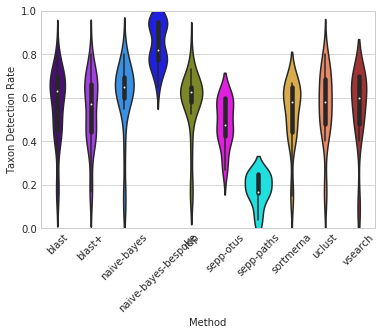

## gg_13_8_otus_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,rdp,0.0,0.316955,0.400501,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.322748,0.388699,-1.0,-1.0,-1.0
4,vsearch,1:0.51:0.8,0.322328,0.380899,-1.0,-1.0,-1.0
0,blast,0.001,0.325565,0.378819,-1.0,-1.0,-1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.322731,0.377720,-1.0,-1.0,-1.0


stat         P     FDR P
Method A  Method B                               
blast     rdp       -3.099268  0.004751  0.021225
          sortmerna  1.000000  0.326892  0.466988
          uclust    -2.713850  0.011871  0.029678
          vsearch   -0.213603  0.832589  0.832589
rdp       sortmerna  3.279839  0.003054  0.021225
          uclust     2.212773  0.036271  0.072541
          vsearch    1.374112  0.181602  0.302670
sortmerna uclust    -2.977862  0.006368  0.021225
          vsearch   -0.343241  0.734287  0.815874
uclust    vsearch    0.646118  0.524091  0.655113

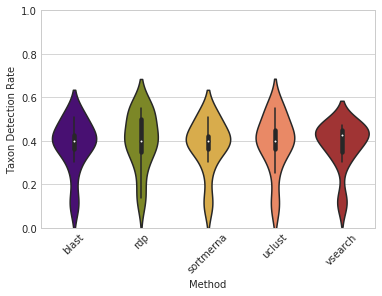

## unite_20.11.2016 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,blast+,0.001:10:0.51:0.99,0.125000,0.166667,0.484479,0.275118,0.350611
2,naive-bayes,0.5,0.166667,0.166667,0.433204,0.275118,0.336498
0,blast,1000,0.087121,0.083333,-0.500000,-0.500000,-0.500000
3,sortmerna,0.51:0.9:1:0.9:1.0,0.090909,0.083333,-0.500000,-0.500000,-0.500000
4,uclust,1.0:0.9:1,0.166667,0.083333,-0.500000,-0.500000,-0.500000
5,vsearch,1:0.51:0.9,0.200000,0.083333,-0.500000,-0.500000,-0.500000


stat    P  FDR P
Method A  Method B                     
blast     sortmerna     NaN  NaN    NaN
          uclust        NaN  NaN    NaN
          vsearch       NaN  NaN    NaN
          blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
sortmerna uclust        NaN  NaN    NaN
          vsearch       NaN  NaN    NaN
          blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
uclust    vsearch       NaN  NaN    NaN
          blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
vsearch   blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
blast+    naive-bayes   NaN  NaN    NaN

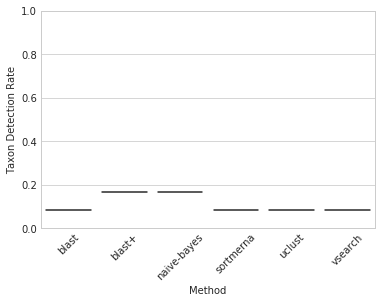

## unite_20.11.2016_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
4,vsearch,1:0.75:0.9,0.272727,0.250000,0.0,0.0,0.0
0,blast,0.001,0.160256,0.166667,0.0,0.0,0.0
1,rdp,0.0,0.148611,0.166667,0.0,0.0,0.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.129167,0.166667,0.0,0.0,0.0
3,uclust,0.51:0.8:1,0.153846,0.166667,0.0,0.0,0.0


stat             P  FDR P
Method A  Method B                                    
blast     rdp                 NaN           NaN    NaN
          sortmerna           NaN           NaN    NaN
          uclust              NaN           NaN    NaN
          vsearch   -1.342714e+16  4.348969e-80    NaN
rdp       sortmerna           NaN           NaN    NaN
          uclust              NaN           NaN    NaN
          vsearch   -1.342714e+16  4.348969e-80    NaN
sortmerna uclust              NaN           NaN    NaN
          vsearch   -1.342714e+16  4.348969e-80    NaN
uclust    vsearch   -1.342714e+16  4.348969e-80    NaN

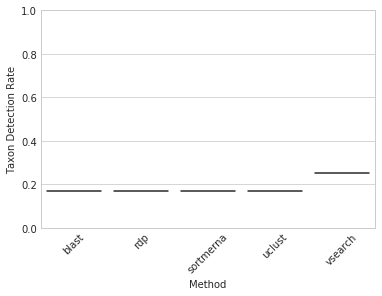

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.676371,0.572348,0.923184,0.923184,0.923184
4,rdp,0.0,0.655162,0.559848,0.917874,0.917874,0.917874
7,vsearch,1:0.75:0.9,0.655308,0.555682,0.926034,0.917874,0.921564
5,sortmerna,0.51:0.9:1:0.9:1.0,0.647884,0.545265,0.911584,0.908469,0.909948
1,blast+,0.001:1:0.99:0.99,0.671091,0.543561,0.932220,0.916338,0.921908
2,naive-bayes,"0.001:char:8192:[9,9]:0.0",0.621065,0.525000,0.873629,0.873629,0.873629
0,blast,1000,0.570511,0.483712,0.857675,0.857675,0.857675
6,uclust,0.76:0.9:1,0.471747,0.387121,0.854546,0.849717,0.851932


stat             P         FDR P
Method A            Method B                                                  
blast               blast+               -9.489526  1.763163e-13  4.114048e-13
                    naive-bayes          -4.897174  7.910673e-06  1.703837e-05
                    naive-bayes-bespoke -12.506615  3.090261e-18  8.652732e-18
                    rdp                 -16.856483  3.146795e-24  2.202756e-23
                    sortmerna            -9.952502  3.072610e-14  7.821189e-14
                    uclust               14.812671  1.535269e-21  4.776392e-21
                    vsearch             -15.332589  3.030879e-22  1.060808e-21
blast+              naive-bayes           1.842923  7.036563e-02  7.577837e-02
                    naive-bayes-bespoke  -4.174667  9.963007e-05  1.859761e-04
                    rdp                  -3.096024  2.999202e-03  4.665425e-03
                    sortmerna            -0.271279  7.871236e-01  7.871236e-01
                    uclust               16.723972  4.630883e-24  2.593294e-23
                    vsearch              -2.654200  1.020184e-02  1.196578e-02
naive-bayes         naive-bayes-bespoke  -4.043111  1.550416e-04  2.713229e-04
                    rdp                  -4.719921  1.494555e-05  2.989110e-05
                    sortmerna            -2.735190  8.220761e-03  1.046279e-02
                    uclust               16.434183  1.085636e-23  5.066302e-23
                    vsearch              -3.721585  4.438152e-04  7.309898e-04
naive-bayes-bespoke rdp                   2.415609  1.882449e-02  2.108343e-02
                    sortmerna             2.918038  4.977709e-03  7.335571e-03
                    uclust               16.287888  1.675308e-23  6.701231e-23
                    vsearch               2.877621  5.570775e-03  7.799086e-03
rdp                 sortmerna             2.652181  1.025638e-02  1.196578e-02
                    uclust               20.673768  1.036278e-28  2.093902e-27
                    vsearch               1.426353  1.590368e-01  1.649270e-01
sortmerna           uclust               20.110366  4.334126e-28  4.045184e-27
                    vsearch              -2.750291  7.892962e-03  1.046279e-02
uclust              vsearch             -20.528170  1.495645e-28  2.093902e-27

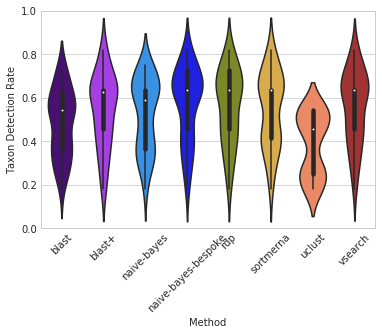

## gg_13_8_otus_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.0,0.0,0.154182,0.046984,0.071758
1,naive-bayes,0.5,0.0,0.0,0.641560,0.157699,0.249845
2,rdp,0.0,0.0,0.0,0.132128,0.132128,0.132128
3,uclust,0.51:0.97:1,0.0,0.0,0.792689,0.693876,0.739772
4,vsearch,10:0.51:0.8,0.0,0.0,0.055153,0.046984,0.050681


stat   P  FDR P
Method A Method B                    
rdp      uclust        NaN NaN    NaN
         vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

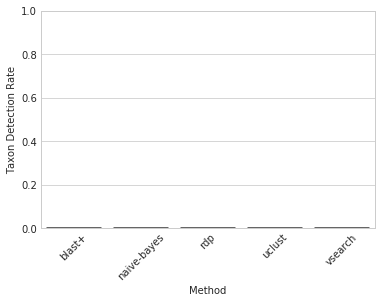

## gg_13_8_otus_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,vsearch,10:0.51:0.97,0.425858,0.30,-1.0,-1.0,-1.0
0,rdp,0.0,0.304800,0.25,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.00,-1.0,-1.0,-1.0


stat         P     FDR P
Method A Method B                               
rdp      uclust    12.247449  0.001172  0.001172
         vsearch        -inf  0.000000  0.000000
uclust   vsearch  -14.696938  0.000683  0.001025

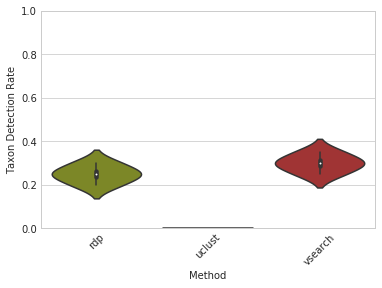

## gg_13_8_otus_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.5",0.973611,0.7875,0.395111,0.395111,0.395111
0,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.636151,0.5500,0.886045,0.860790,0.873227


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,-19.0,0.000318,0.000318


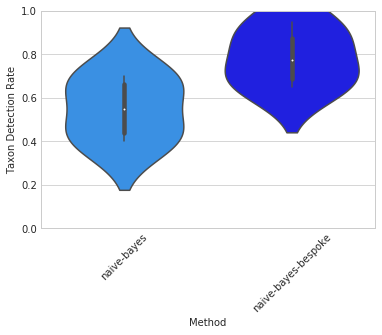

## silva_123_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,uclust,0.51:0.9:5,0.527624,0.404762,-1.0,-1.0,-1.0
3,vsearch,1:0.51:0.97,0.467322,0.369048,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.350376,0.273810,-1.0,-1.0,-1.0
0,blast+,0.001:1:0.51:0.8,0.341768,0.250000,-1.0,-1.0,-1.0


stat         P     FDR P
Method A Method B                                  
uclust   vsearch       1.566699  0.215170  0.258204
         blast+       13.000000  0.000983  0.004827
         naive-bayes  11.000000  0.001609  0.004827
vsearch  blast+        5.000000  0.015392  0.030785
         naive-bayes   3.464102  0.040519  0.060779
blast+   naive-bayes  -1.000000  0.391002  0.391002

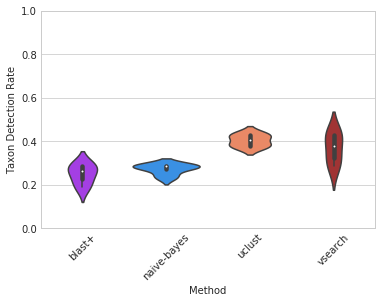

## silva_123_clean_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.99:3,0.554198,0.440476,-1.0,-1.0,-1.0
1,vsearch,1:0.51:0.97,0.463996,0.357143,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,3.655631,0.035353,0.035353


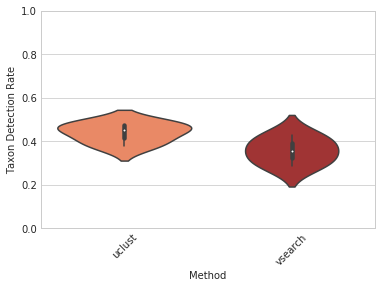

## silva_123_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,naive-bayes,0.5,0.484109,0.369048,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.389724,0.309524,-1.0,-1.0,-1.0
3,vsearch,1:0.51:0.8,0.351887,0.273810,-1.0,-1.0,-1.0
0,blast+,0.001:1:0.51:0.8,0.091181,0.071429,-1.0,-1.0,-1.0


stat         P     FDR P
Method A Method B                                  
uclust   vsearch       3.000000  0.057669  0.057669
         blast+             inf  0.000000  0.000000
         naive-bayes  -5.000000  0.015392  0.019532
vsearch  blast+       17.000000  0.000443  0.000887
         naive-bayes  -4.898979  0.016277  0.019532
blast+   naive-bayes -25.000000  0.000140  0.000421

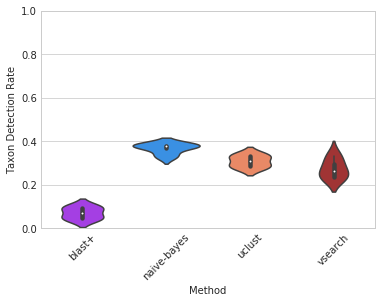

## unite_20.11.2016_clean_trim100 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.163743,0.250000,-1.0,-1.0,-1.0
1,uclust,1.0:0.9:5,0.166667,0.083333,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.125000,0.083333,-1.0,-1.0,-1.0


stat             P  FDR P
Method A Method B                                   
rdp      uclust    8.492069e+15  1.386670e-32    NaN
         vsearch   8.492069e+15  1.386670e-32    NaN
uclust   vsearch            NaN           NaN    NaN

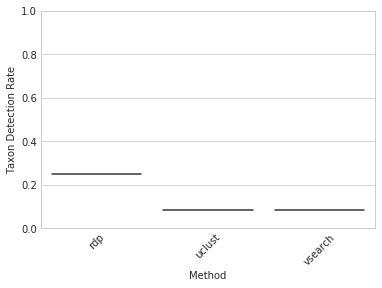

## unite_20.11.2016_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.130556,0.166667,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


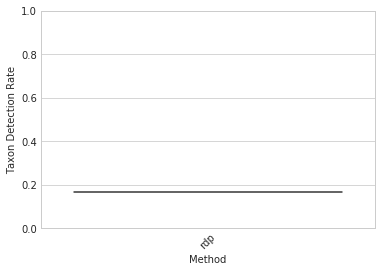

## Precision

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
9,vsearch,100:0.99:0.97,0.163237,0.175711,0.989018,0.148624,0.246441
3,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.98",0.709284,0.723084,0.986527,0.536697,0.675678
1,blast+,0.001:100:0.99:0.8,0.102254,0.101955,0.946415,0.044103,0.075344
7,sortmerna,1.0:0.99:5:0.9:1.0,0.327761,0.375044,0.895137,0.285814,0.415202
2,naive-bayes,"0.001:char:8192:[6,6]:0.9",0.311081,0.372442,0.877708,0.279706,0.399944
4,rdp,1.0,0.147598,0.186671,0.842616,0.149409,0.224257
8,uclust,1.0:0.9:5,0.265325,0.309874,0.833990,0.249364,0.370439
0,blast,1000,0.473978,0.562493,0.742721,0.661915,0.696156
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P     FDR P
Method A            Method B                                             
blast               blast+              -3.750900  6.783083e-04  0.004361
                    naive-bayes         -2.745738  9.697079e-03  0.048485
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                 -2.448796  1.981377e-02  0.089162
                    sortmerna           -6.125369  6.674150e-07  0.000015
                    uclust              -4.686626  4.630712e-05  0.000521
                    vsearch             -6.191924  5.490367e-07  0.000015
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
blast+              naive-bayes          1.843183  7.429996e-02  0.257192
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  1.635963  1.113511e-01  0.357914
                    sortmerna            1.274956  2.112287e-01  0.573941
                    uclust               2.043089  4.909652e-02  0.184112
                    vsearch             -1.259117  2.168222e-01  0.573941
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  0.603081  5.505775e-01  1.000000
                    sortmerna           -0.638158  5.277748e-01  1.000000
                    uclust               0.896799  3.763224e-01  0.891290
                    vsearch             -5.914619  1.240301e-06  0.000019
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes-bespoke rdp                  0.000000  1.000000e+00  1.000000
                    sortmerna            0.000000  1.000000e+00  1.000000
                    uclust               0.000000  1.000000e+00  1.000000
                    vsearch              0.000000  1.000000e+00  1.000000
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
rdp                 sortmerna           -1.090691  2.833089e-01  0.708272
                    uclust               0.187960  8.520591e-01  1.000000
                    vsearch             -2.909611  6.433016e-03  0.036186
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sortmerna           uclust               2.177116  3.672663e-02  0.150245
                    vsearch             -4.342346  1.261130e-04  0.001135
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
uclust              vsearch             -3.993104  3.431066e-04  0.002573
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sepp-paths          sepp-otus           -1.441427  1.642109e-01  0.492633

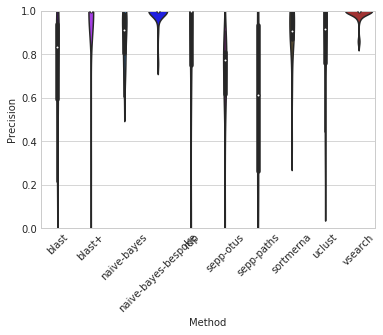

## gg_13_8_otus_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.325565,0.378819,-1.0,-1.0,-1.0
1,rdp,0.0,0.316955,0.400501,-1.0,-1.0,-1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.322731,0.377720,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.322748,0.388699,-1.0,-1.0,-1.0
4,vsearch,100:0.51:0.8,0.128230,0.130850,-1.0,-1.0,-1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

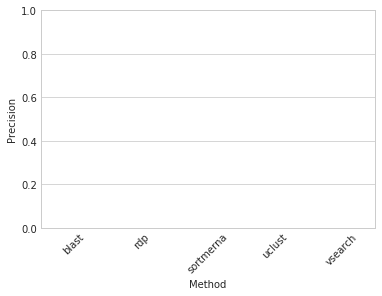

## unite_20.11.2016 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,naive-bayes,0.8,0.181818,0.166667,0.612712,0.275118,0.379565
1,blast+,0.001:10:0.99:0.99,0.181818,0.166667,0.586026,0.275118,0.374279
0,blast,1000,0.087121,0.083333,-0.500000,-0.500000,-0.500000
3,sortmerna,0.51:0.99:1:0.9:1.0,0.000000,0.000000,-0.500000,-0.500000,-0.500000
4,uclust,0.51:0.97:1,0.000000,0.000000,-0.500000,-0.500000,-0.500000
5,vsearch,100:0.51:0.8,0.000000,0.000000,-0.500000,-0.500000,-0.500000


stat         P  FDR P
Method A  Method B                               
blast     sortmerna          NaN       NaN    NaN
          uclust             NaN       NaN    NaN
          vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
sortmerna uclust             NaN       NaN    NaN
          vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
uclust    vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
vsearch   blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
blast+    naive-bayes -12.305876  0.006539    NaN

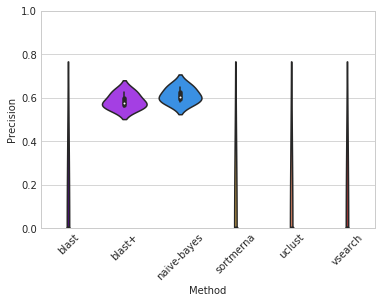

## unite_20.11.2016_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.160256,0.166667,0.0,0.0,0.0
1,rdp,0.0,0.148611,0.166667,0.0,0.0,0.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.129167,0.166667,0.0,0.0,0.0
3,uclust,0.51:0.8:1,0.153846,0.166667,0.0,0.0,0.0
4,vsearch,100:0.51:0.8,0.174242,0.166667,0.0,0.0,0.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

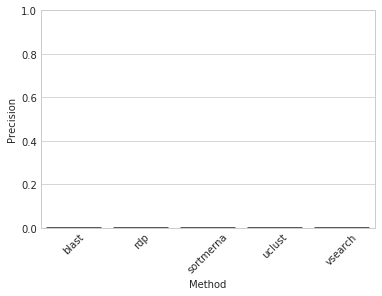

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[9,9]:0.94",0.665330,0.548151,0.973077,0.924192,0.939285
5,sortmerna,1.0:0.99:5:0.9:1.0,0.660981,0.536174,0.971687,0.916463,0.933322
1,blast+,0.001:10:0.99:0.99,0.507883,0.406061,0.966601,0.794862,0.859591
4,rdp,1.0,0.468384,0.366288,0.943913,0.737335,0.817753
6,uclust,0.76:0.99:3,0.539127,0.291288,0.941494,0.432743,0.526520
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.613631,0.503409,0.936461,0.871684,0.897491
7,vsearch,100:0.51:0.97,0.444380,0.362689,0.929850,0.749145,0.822708
0,blast,1000,0.570511,0.483712,0.857675,0.857675,0.857675


stat             P     FDR P
Method A            Method B                                             
blast               blast+              -4.928133  7.072600e-06  0.000033
                    naive-bayes         -6.127290  7.942948e-08  0.000001
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                 -5.762123  3.198021e-07  0.000002
                    sortmerna           -5.056665  4.431465e-06  0.000025
                    uclust              -5.985521  1.366799e-07  0.000001
                    vsearch             -6.078652  9.571263e-08  0.000001
blast+              naive-bayes          2.212374  3.082414e-02  0.072172
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  1.803659  7.639087e-02  0.140971
                    sortmerna           -1.778011  8.055513e-02  0.140971
                    uclust               2.197944  3.188952e-02  0.072172
                    vsearch              2.571598  1.266272e-02  0.044320
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                 -1.409306  1.639939e-01  0.270108
                    sortmerna           -2.441849  1.762884e-02  0.049361
                    uclust              -2.029233  4.695374e-02  0.093907
                    vsearch              0.667655  5.069569e-01  0.709740
naive-bayes-bespoke rdp                  0.000000  1.000000e+00  1.000000
                    sortmerna            0.000000  1.000000e+00  1.000000
                    uclust               0.000000  1.000000e+00  1.000000
                    vsearch              0.000000  1.000000e+00  1.000000
rdp                 sortmerna           -2.176806  3.350865e-02  0.072172
                    uclust               0.548477  5.854341e-01  0.780579
                    vsearch              1.374529  1.744759e-01  0.271407
sortmerna           uclust               2.479312  1.604009e-02  0.049361
                    vsearch              2.866839  5.739691e-03  0.022959
uclust              vsearch              1.230934  2.232323e-01  0.328974

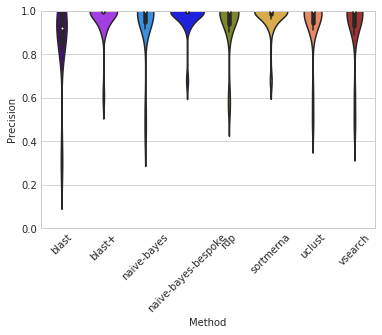

## gg_13_8_otus_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,rdp,1.0,0.0,0.0,1.000000,0.088988,0.160555
3,uclust,0.76:0.99:3,0.0,0.0,0.925106,0.693876,0.791352
0,blast+,0.001:1:0.51:0.99,0.0,0.0,0.899145,0.708025,0.791578
1,naive-bayes,0.8,0.0,0.0,0.788002,0.101050,0.178816
4,vsearch,10:0.99:0.99,0.0,0.0,0.192446,0.058770,0.089768


stat         P     FDR P
Method A Method B                                  
rdp      uclust        3.103643  0.053144  0.075920
         vsearch      15.205505  0.000618  0.002059
         blast+        2.650261  0.076977  0.095709
         naive-bayes  11.650973  0.001358  0.003396
uclust   vsearch      24.063501  0.000157  0.000786
         blast+        1.856184  0.160436  0.160436
         naive-bayes   4.379420  0.022038  0.036730
vsearch  blast+      -39.349797  0.000036  0.000361
         naive-bayes  -9.672946  0.002346  0.004692
blast+   naive-bayes   2.520511  0.086138  0.095709

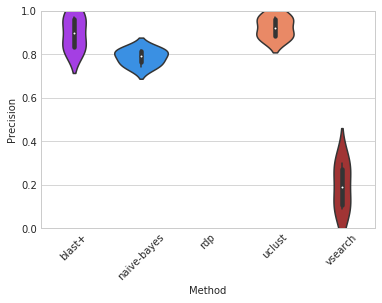

## gg_13_8_otus_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.304800,0.25,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.00,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.425858,0.30,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

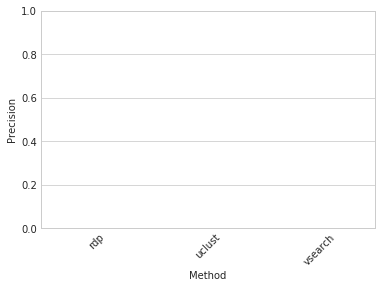

## gg_13_8_otus_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,naive-bayes,"0.001:char:8192:[7,7]:0.98",0.282473,0.2250,1.0,0.083602,0.151207
1,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.7",0.850636,0.7125,1.0,0.325782,0.483042


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,NaN,NaN,NaN


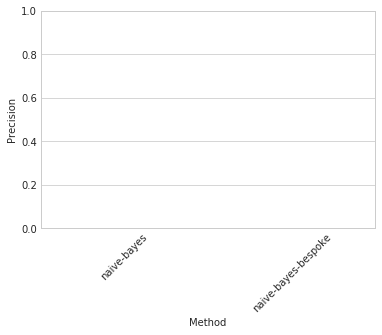

## silva_123_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.276641,0.214286,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.350376,0.273810,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.363849,0.297619,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.402133,0.309524,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

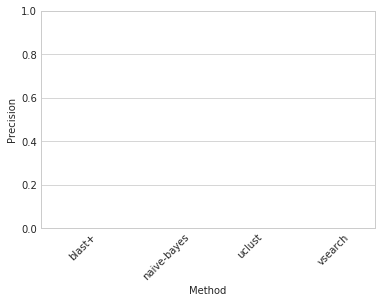

## silva_123_clean_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.97:1,0.298390,0.226190,-1.0,-1.0,-1.0
1,vsearch,10:0.51:0.97,0.335816,0.261905,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,NaN,NaN,NaN


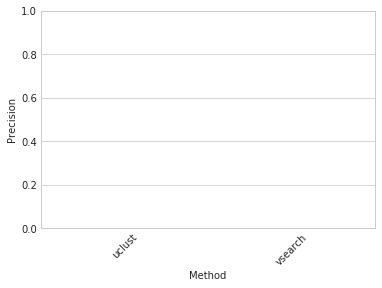

## silva_123_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.064135,0.047619,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.484109,0.369048,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.389724,0.309524,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.188237,0.142857,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

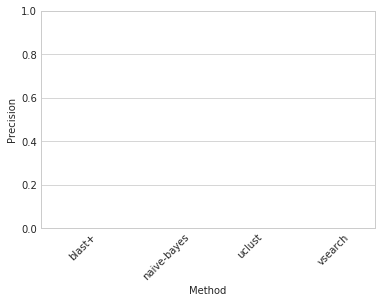

## unite_20.11.2016_clean_trim100 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.163743,0.250000,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.125000,0.083333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

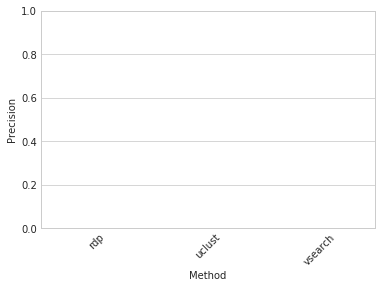

## unite_20.11.2016_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.130556,0.166667,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


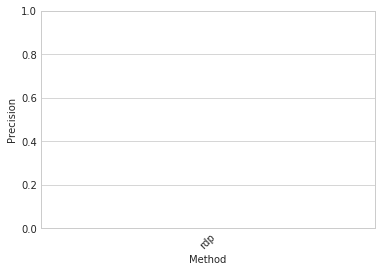

## Recall

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.0",0.779569,0.829707,0.964806,0.913330,0.936223
0,blast,1000,0.473978,0.562493,0.742721,0.661915,0.696156
9,vsearch,1:0.51:0.9,0.482258,0.555032,0.724588,0.656009,0.686290
1,blast+,0.001:1:0.51:0.8,0.467784,0.537493,0.701426,0.624891,0.657060
8,uclust,0.76:0.9:1,0.482203,0.560375,0.720807,0.582836,0.633120
7,sortmerna,0.51:0.9:1:0.9:1.0,0.448676,0.527380,0.573458,0.506177,0.534869
2,naive-bayes,"0.001:char:8192:[9,9]:0.0",0.434284,0.580570,0.602775,0.478006,0.522893
4,rdp,0.0,0.431047,0.574165,0.699703,0.461855,0.536856
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                 
blast               blast+               1.784271  8.357731e-02  2.686413e-01
                    naive-bayes          2.500401  1.755015e-02  1.128224e-01
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                  2.909605  6.433112e-03  5.789801e-02
                    sortmerna            3.352293  2.021853e-03  3.032779e-02
                    uclust               1.990860  5.482990e-02  1.905111e-01
                    vsearch              0.292769  7.715319e-01  1.000000e+00
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes          1.989068  5.503654e-02  1.905111e-01
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                  2.349054  2.495907e-02  1.247954e-01
                    sortmerna            2.437144  2.036044e-02  1.145275e-01
                    uclust               0.955727  3.461594e-01  8.075307e-01
                    vsearch             -1.349443  1.863804e-01  4.933600e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                  1.711844  9.630987e-02  2.889296e-01
                    sortmerna           -0.533051  5.975698e-01  1.000000e+00
                    uclust              -1.651046  1.082157e-01  3.043567e-01
                    vsearch             -2.562721  1.513341e-02  1.128224e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                  0.000000  1.000000e+00  1.000000e+00
                    sortmerna            0.000000  1.000000e+00  1.000000e+00
                    uclust               0.000000  1.000000e+00  1.000000e+00
                    vsearch              0.000000  1.000000e+00  1.000000e+00
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna           -0.930436  3.589025e-01  8.075307e-01
                    uclust              -2.048481  4.853571e-02  1.905111e-01
                    vsearch             -3.000892  5.095414e-03  5.732340e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust              -1.204521  2.369565e-01  5.923913e-01
                    vsearch             -3.370542  1.925037e-03  3.032779e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
uclust              vsearch             -2.005869  5.312527e-02  1.905111e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -8.729984  1.975406e-08  8.889328e-07

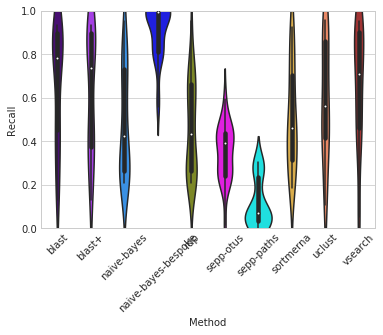

## gg_13_8_otus_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.325565,0.378819,-1.0,-1.0,-1.0
1,rdp,0.0,0.316955,0.400501,-1.0,-1.0,-1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.322731,0.377720,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.322748,0.388699,-1.0,-1.0,-1.0
4,vsearch,100:0.51:0.8,0.128230,0.130850,-1.0,-1.0,-1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

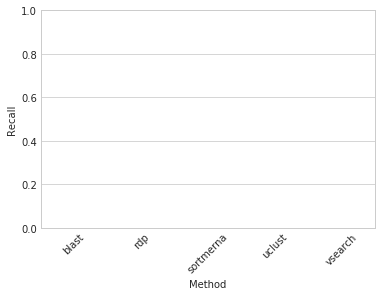

## unite_20.11.2016 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,blast+,0.001:10:0.51:0.99,0.125000,0.166667,0.484479,0.275118,0.350611
2,naive-bayes,0.5,0.166667,0.166667,0.433204,0.275118,0.336498
0,blast,1000,0.087121,0.083333,-0.500000,-0.500000,-0.500000
3,sortmerna,0.51:0.99:1:0.9:1.0,0.000000,0.000000,-0.500000,-0.500000,-0.500000
4,uclust,0.51:0.97:1,0.000000,0.000000,-0.500000,-0.500000,-0.500000
5,vsearch,100:0.51:0.8,0.000000,0.000000,-0.500000,-0.500000,-0.500000


stat    P  FDR P
Method A  Method B                     
blast     sortmerna     NaN  NaN    NaN
          uclust        NaN  NaN    NaN
          vsearch       NaN  NaN    NaN
          blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
sortmerna uclust        NaN  NaN    NaN
          vsearch       NaN  NaN    NaN
          blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
uclust    vsearch       NaN  NaN    NaN
          blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
vsearch   blast+        0.0  1.0    NaN
          naive-bayes   0.0  1.0    NaN
blast+    naive-bayes   NaN  NaN    NaN

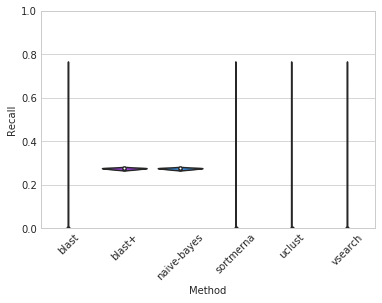

## unite_20.11.2016_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.160256,0.166667,0.0,0.0,0.0
1,rdp,0.0,0.148611,0.166667,0.0,0.0,0.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.129167,0.166667,0.0,0.0,0.0
3,uclust,0.51:0.8:1,0.153846,0.166667,0.0,0.0,0.0
4,vsearch,100:0.51:0.8,0.174242,0.166667,0.0,0.0,0.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

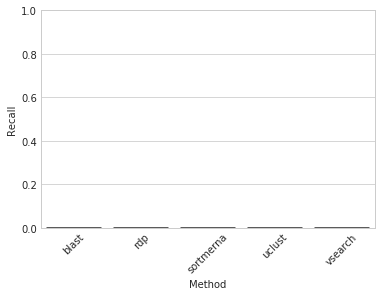

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.679121,0.569337,0.931322,0.931322,0.931322
4,rdp,0.0,0.655162,0.559848,0.917874,0.917874,0.917874
7,vsearch,1:0.75:0.9,0.655308,0.555682,0.926034,0.917874,0.921564
5,sortmerna,0.51:0.99:5:0.9:1.0,0.657776,0.536174,0.948829,0.916463,0.927807
1,blast+,0.001:1:0.99:0.99,0.671091,0.543561,0.932220,0.916338,0.921908
2,naive-bayes,"0.001:char:8192:[16,16]:0.5",0.625716,0.518182,0.895647,0.892136,0.893689
0,blast,1000,0.570511,0.483712,0.857675,0.857675,0.857675
6,uclust,0.76:0.9:1,0.471747,0.387121,0.854546,0.849717,0.851932


stat             P  FDR P
Method A            Method B                                          
blast               blast+              -6.873641  4.425438e-09    NaN
                    naive-bayes         -2.516106  1.460649e-02    NaN
                    naive-bayes-bespoke  0.000000  1.000000e+00    NaN
                    rdp                 -7.143649  1.545197e-09    NaN
                    sortmerna           -6.879142  4.331672e-09    NaN
                    uclust               3.209448  2.152202e-03    NaN
                    vsearch             -7.143649  1.545197e-09    NaN
blast+              naive-bayes          2.039694  4.586650e-02    NaN
                    naive-bayes-bespoke  0.000000  1.000000e+00    NaN
                    rdp                 -1.707437  9.299870e-02    NaN
                    sortmerna           -1.426006  1.591365e-01    NaN
                    uclust               7.806070  1.164994e-10    NaN
                    vsearch             -1.707437  9.299870e-02    NaN
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00    NaN
                    rdp                 -2.147553  3.586803e-02    NaN
                    sortmerna           -2.051037  4.471237e-02    NaN
                    uclust               3.423764  1.128913e-03    NaN
                    vsearch             -2.147553  3.586803e-02    NaN
naive-bayes-bespoke rdp                  0.000000  1.000000e+00    NaN
                    sortmerna            0.000000  1.000000e+00    NaN
                    uclust               0.000000  1.000000e+00    NaN
                    vsearch              0.000000  1.000000e+00    NaN
rdp                 sortmerna            1.570186  1.217199e-01    NaN
                    uclust               8.077463  4.047436e-11    NaN
                    vsearch                   NaN           NaN    NaN
sortmerna           uclust               7.812138  1.137753e-10    NaN
                    vsearch             -1.570186  1.217199e-01    NaN
uclust              vsearch             -8.077463  4.047436e-11    NaN

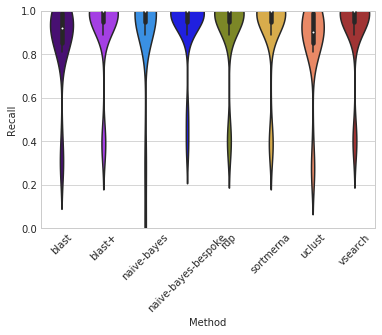

## gg_13_8_otus_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:1:0.51:0.8,0.0,0.0,0.708025,0.708025,0.708025
3,uclust,0.76:0.9:1,0.0,0.0,0.708025,0.708025,0.708025
1,naive-bayes,0.5,0.0,0.0,0.641560,0.157699,0.249845
2,rdp,0.0,0.0,0.0,0.132128,0.132128,0.132128
4,vsearch,10:0.51:0.97,0.0,0.0,0.104260,0.103136,0.103690


stat         P  FDR P
Method A Method B                               
rdp      uclust      -17.712116  0.000392    NaN
         vsearch       8.695851  0.003201    NaN
         blast+      -17.712116  0.000392    NaN
         naive-bayes  -1.258345  0.297289    NaN
uclust   vsearch      20.618314  0.000249    NaN
         blast+             NaN       NaN    NaN
         naive-bayes  10.470612  0.001860    NaN
vsearch  blast+      -20.618314  0.000249    NaN
         naive-bayes  -2.334504  0.101729    NaN
blast+   naive-bayes  10.470612  0.001860    NaN

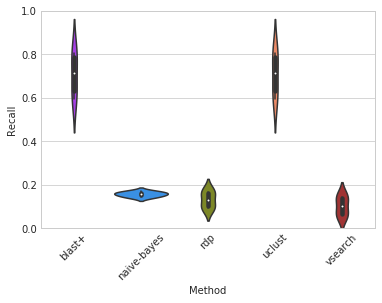

## gg_13_8_otus_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.304800,0.25,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.00,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.425858,0.30,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

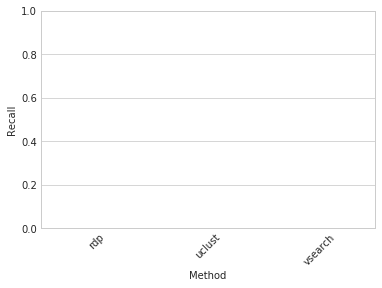

## gg_13_8_otus_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.0",0.973611,0.7875,1.000000,1.00000,1.000000
0,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.636151,0.5500,0.886045,0.86079,0.873227


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,-3.004834,0.057447,0.057447


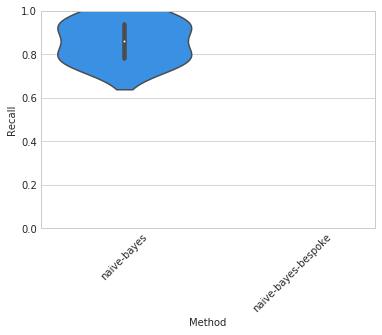

## silva_123_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.276641,0.214286,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.350376,0.273810,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.363849,0.297619,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.402133,0.309524,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

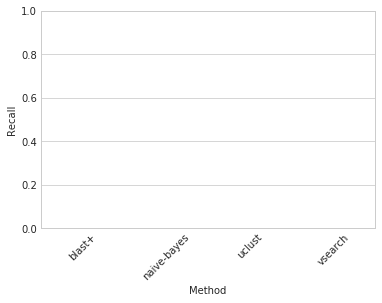

## silva_123_clean_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.97:1,0.298390,0.226190,-1.0,-1.0,-1.0
1,vsearch,10:0.51:0.97,0.335816,0.261905,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,NaN,NaN,NaN


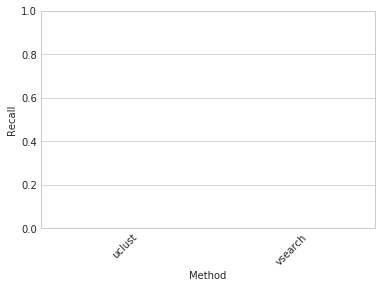

## silva_123_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.064135,0.047619,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.484109,0.369048,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.389724,0.309524,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.188237,0.142857,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

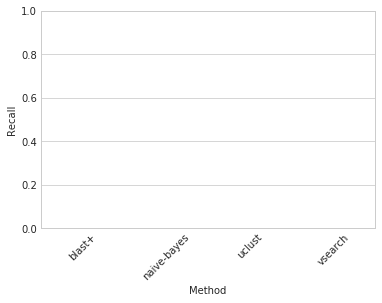

## unite_20.11.2016_clean_trim100 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.163743,0.250000,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.125000,0.083333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

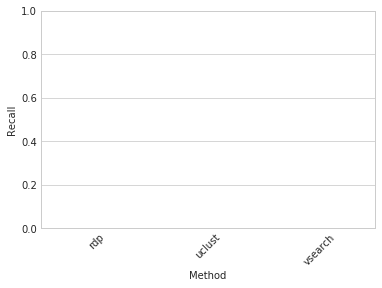

## unite_20.11.2016_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.130556,0.166667,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


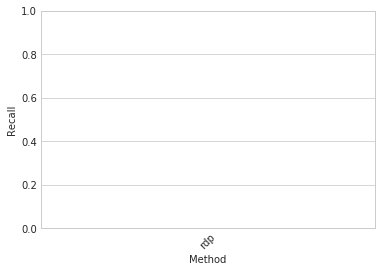

## F-measure

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.774533,0.829707,0.966365,0.913330,0.936868
0,blast,1000,0.473978,0.562493,0.742721,0.661915,0.696156
9,vsearch,1:0.75:0.97,0.480752,0.552090,0.725225,0.655916,0.686423
1,blast+,0.001:1:0.99:0.99,0.483883,0.534388,0.716598,0.623700,0.662533
8,uclust,0.51:0.9:1,0.482203,0.560375,0.720807,0.582836,0.633120
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.466330,0.600390,0.712715,0.469003,0.546463
4,rdp,0.4,0.435840,0.551868,0.716633,0.459564,0.541983
7,sortmerna,0.51:0.9:1:0.9:1.0,0.448676,0.527380,0.573458,0.506177,0.534869
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P     FDR P
Method A            Method B                                             
blast               blast+               1.823289  7.732932e-02  0.289985
                    naive-bayes          2.488057  1.806893e-02  0.108144
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  2.476429  1.857044e-02  0.108144
                    sortmerna            3.423245  1.669779e-03  0.035283
                    uclust               1.965619  5.780417e-02  0.276103
                    vsearch              0.532628  5.978600e-01  1.000000
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
blast+              naive-bayes          1.876848  6.940435e-02  0.283927
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  1.936915  6.135617e-02  0.276103
                    sortmerna            2.623907  1.306236e-02  0.108144
                    uclust               0.806157  4.259239e-01  1.000000
                    vsearch             -1.197252  2.397383e-01  0.634601
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00  1.000000
                    rdp                  0.583283  5.636679e-01  1.000000
                    sortmerna            0.273734  7.859951e-01  1.000000
                    uclust              -1.621301  1.144705e-01  0.321948
                    vsearch             -2.469182  1.888945e-02  0.108144
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes-bespoke rdp                  0.000000  1.000000e+00  1.000000
                    sortmerna            0.000000  1.000000e+00  1.000000
                    uclust               0.000000  1.000000e+00  1.000000
                    vsearch              0.000000  1.000000e+00  1.000000
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
rdp                 sortmerna            0.162218  8.721234e-01  1.000000
                    uclust              -1.654211  1.075672e-01  0.321948
                    vsearch             -2.461666  1.922554e-02  0.108144
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sortmerna           uclust              -1.624555  1.137721e-01  0.321948
                    vsearch             -3.295776  2.352203e-03  0.035283
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
uclust              vsearch             -1.759594  8.774559e-02  0.303735
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sepp-paths          sepp-otus           -7.716839  1.460326e-07  0.000007

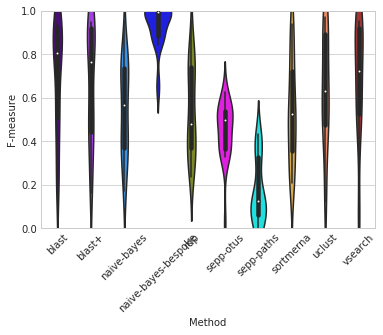

## gg_13_8_otus_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.325565,0.378819,-1.0,-1.0,-1.0
1,rdp,0.0,0.316955,0.400501,-1.0,-1.0,-1.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.322731,0.377720,-1.0,-1.0,-1.0
3,uclust,0.51:0.8:1,0.322748,0.388699,-1.0,-1.0,-1.0
4,vsearch,100:0.51:0.8,0.128230,0.130850,-1.0,-1.0,-1.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

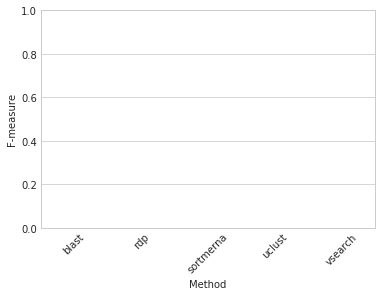

## unite_20.11.2016 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
2,naive-bayes,0.8,0.181818,0.166667,0.612712,0.275118,0.379565
1,blast+,0.001:10:0.99:0.99,0.181818,0.166667,0.586026,0.275118,0.374279
0,blast,1000,0.087121,0.083333,-0.500000,-0.500000,-0.500000
3,sortmerna,0.51:0.99:1:0.9:1.0,0.000000,0.000000,-0.500000,-0.500000,-0.500000
4,uclust,0.51:0.97:1,0.000000,0.000000,-0.500000,-0.500000,-0.500000
5,vsearch,100:0.51:0.8,0.000000,0.000000,-0.500000,-0.500000,-0.500000


stat         P  FDR P
Method A  Method B                               
blast     sortmerna          NaN       NaN    NaN
          uclust             NaN       NaN    NaN
          vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
sortmerna uclust             NaN       NaN    NaN
          vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
uclust    vsearch            NaN       NaN    NaN
          blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
vsearch   blast+        0.000000  1.000000    NaN
          naive-bayes   0.000000  1.000000    NaN
blast+    naive-bayes -12.743173  0.006102    NaN

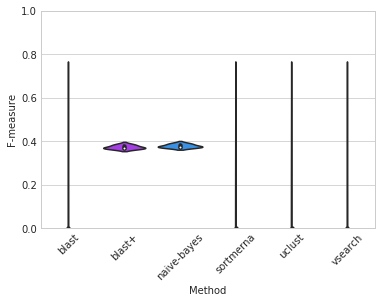

## unite_20.11.2016_clean level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast,0.001,0.160256,0.166667,0.0,0.0,0.0
1,rdp,0.0,0.148611,0.166667,0.0,0.0,0.0
2,sortmerna,0.51:0.8:1:0.8:1.0,0.129167,0.166667,0.0,0.0,0.0
3,uclust,0.51:0.8:1,0.153846,0.166667,0.0,0.0,0.0
4,vsearch,100:0.51:0.8,0.174242,0.166667,0.0,0.0,0.0


stat   P  FDR P
Method A  Method B                  
blast     rdp         NaN NaN    NaN
          sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
rdp       sortmerna   NaN NaN    NaN
          uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
sortmerna uclust      NaN NaN    NaN
          vsearch     NaN NaN    NaN
uclust    vsearch     NaN NaN    NaN

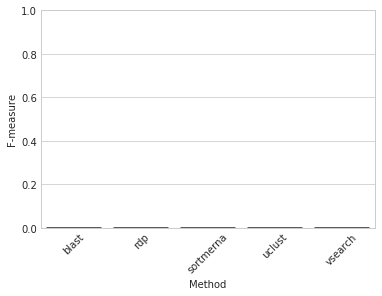

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.94",0.669836,0.546032,0.972887,0.929592,0.944469
5,sortmerna,1.0:0.99:5:0.9:1.0,0.660981,0.536174,0.971687,0.916463,0.933322
4,rdp,0.6,0.653354,0.559848,0.942793,0.917874,0.927453
1,blast+,0.001:1:0.99:0.99,0.671091,0.543561,0.932220,0.916338,0.921908
7,vsearch,1:0.75:0.9,0.655308,0.555682,0.926034,0.917874,0.921564
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.613631,0.503409,0.936461,0.871684,0.897491
0,blast,1000,0.570511,0.483712,0.857675,0.857675,0.857675
6,uclust,0.51:0.9:1,0.471747,0.387121,0.854546,0.849717,0.851932


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -7.606948  2.533318e-10  1.182215e-09
                    naive-bayes         -3.529709  8.137442e-04  1.627488e-03
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                 -7.642883  2.201841e-10  1.182215e-09
                    sortmerna           -7.084746  1.944248e-09  6.804867e-09
                    uclust               2.472737  1.630922e-02  2.686224e-02
                    vsearch             -7.270945  9.403240e-10  3.761296e-09
blast+              naive-bayes          4.559038  2.641933e-05  7.397413e-05
                    naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                 -2.809092  6.727757e-03  1.255848e-02
                    sortmerna           -2.265082  2.719421e-02  4.230210e-02
                    uclust               8.505414  7.687258e-12  1.362573e-10
                    vsearch              0.143413  8.864525e-01  1.000000e+00
naive-bayes         naive-bayes-bespoke  0.000000  1.000000e+00  1.000000e+00
                    rdp                 -5.020665  5.053494e-06  1.572198e-05
                    sortmerna           -4.284749  6.847673e-05  1.597790e-04
                    uclust               4.349981  5.472237e-05  1.392933e-04
                    vsearch             -3.673821  5.169163e-04  1.113358e-03
naive-bayes-bespoke rdp                  0.000000  1.000000e+00  1.000000e+00
                    sortmerna            0.000000  1.000000e+00  1.000000e+00
                    uclust               0.000000  1.000000e+00  1.000000e+00
                    vsearch              0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna           -1.685223  9.722832e-02  1.361196e-01
                    uclust               8.444487  9.732667e-12  1.362573e-10
                    vsearch              1.936669  5.757956e-02  8.485409e-02
sortmerna           uclust               7.616353  2.442020e-10  1.182215e-09
                    vsearch              2.672039  9.731344e-03  1.702985e-02
uclust              vsearch             -8.081083  3.990831e-11  3.724776e-10

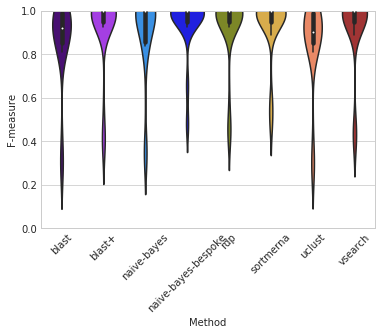

## gg_13_8_otus_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,uclust,0.51:0.99:3,0.0,0.0,0.918073,0.708025,0.798342
0,blast+,0.001:1:0.51:0.99,0.0,0.0,0.899145,0.708025,0.791578
1,naive-bayes,0.5,0.0,0.0,0.641560,0.157699,0.249845
2,rdp,0.9,0.0,0.0,0.523258,0.103136,0.171456
4,vsearch,10:0.51:0.97,0.0,0.0,0.104260,0.103136,0.103690


stat         P     FDR P
Method A Method B                                   
rdp      uclust      -106.504483  0.000002  0.000018
         vsearch        3.694238  0.034415  0.043019
         blast+       -78.921689  0.000004  0.000022
         naive-bayes   -2.373096  0.098229  0.109143
uclust   vsearch       32.761575  0.000063  0.000208
         blast+         1.929034  0.149308  0.149308
         naive-bayes   14.924967  0.000653  0.001306
vsearch  blast+       -27.965900  0.000100  0.000251
         naive-bayes   -9.129670  0.002778  0.003968
blast+   naive-bayes   13.544852  0.000870  0.001451

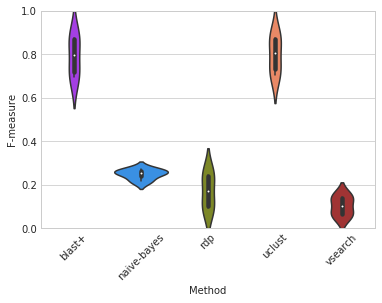

## gg_13_8_otus_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.304800,0.25,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.00,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.425858,0.30,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

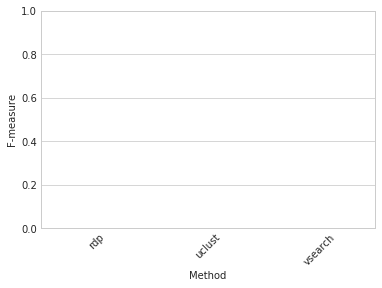

## gg_13_8_otus_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
1,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.0",0.973611,0.7875,1.000000,1.00000,1.000000
0,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.636151,0.5500,0.886045,0.86079,0.873227


,,stat,P,FDR P
Method A,Method B,,,
naive-bayes,naive-bayes-bespoke,-2.781577,0.0689,0.0689


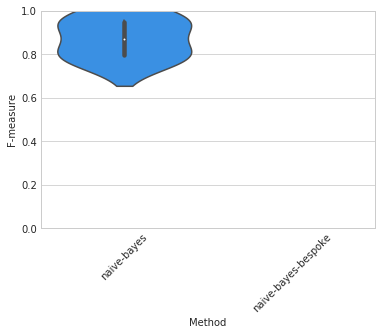

## silva_123_clean_full16S level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.276641,0.214286,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.350376,0.273810,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.363849,0.297619,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.402133,0.309524,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

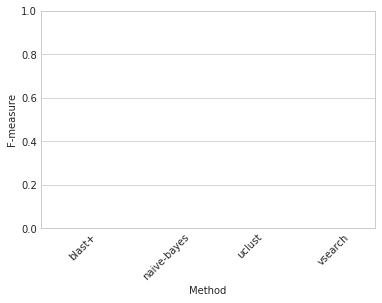

## silva_123_clean_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,uclust,0.51:0.97:1,0.298390,0.226190,-1.0,-1.0,-1.0
1,vsearch,10:0.51:0.97,0.335816,0.261905,-1.0,-1.0,-1.0


,,stat,P,FDR P
Method A,Method B,,,
uclust,vsearch,NaN,NaN,NaN


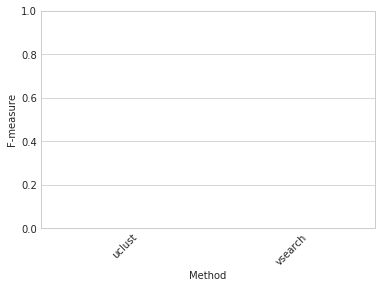

## silva_123_v4_trim250 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,blast+,0.001:10:0.51:0.8,0.064135,0.047619,-1.0,-1.0,-1.0
1,naive-bayes,0.5,0.484109,0.369048,-1.0,-1.0,-1.0
2,uclust,0.51:0.97:1,0.389724,0.309524,-1.0,-1.0,-1.0
3,vsearch,10:0.51:0.8,0.188237,0.142857,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                    
uclust   vsearch       NaN NaN    NaN
         blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
vsearch  blast+        NaN NaN    NaN
         naive-bayes   NaN NaN    NaN
blast+   naive-bayes   NaN NaN    NaN

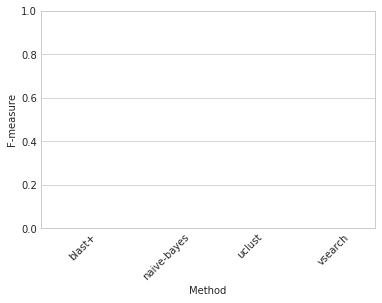

## unite_20.11.2016_clean_trim100 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.163743,0.250000,-1.0,-1.0,-1.0
1,uclust,0.51:0.97:1,0.000000,0.000000,-1.0,-1.0,-1.0
2,vsearch,10:0.51:0.97,0.125000,0.083333,-1.0,-1.0,-1.0


stat   P  FDR P
Method A Method B                 
rdp      uclust     NaN NaN    NaN
         vsearch    NaN NaN    NaN
uclust   vsearch    NaN NaN    NaN

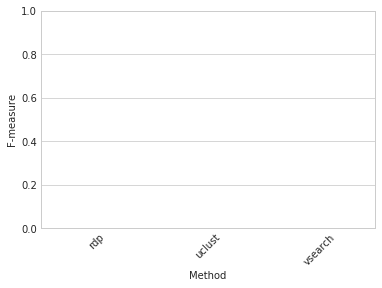

## unite_20.11.2016_clean_trim150 level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
0,rdp,0.0,0.130556,0.166667,-1.0,-1.0,-1.0


,,stat,P
Method A,Method B,,


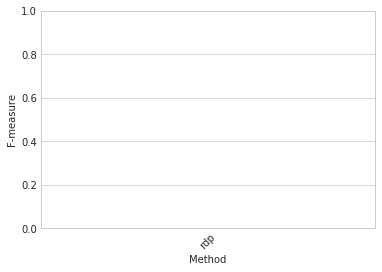

In [58]:
for metric in ["Taxon Accuracy Rate", "Taxon Detection Rate", "Precision", "Recall", "F-measure"]:
    display(Markdown('## {0}'.format(metric)))
    boxes = rank_optimized_method_performance_by_dataset(mock_results,
                                                         dataset="Reference",
                                                         metric=metric,
                                                         level_range=range(6,7),
                                                         display_fields=["Method",
                                                                         "Parameters",
                                                                         "Taxon Accuracy Rate",
                                                                         "Taxon Detection Rate",
                                                                         "Precision",
                                                                         "Recall",
                                                                         "F-measure"],
                                                         paired=True,
                                                         parametric=True,
                                                         color=None,
                                                         color_palette=color_palette)
    #for k, v in boxes.items():
    #    v.get_figure().savefig(join(outdir, 'mock-{0}-{1}-boxplots.pdf'.format(metric, k)))

## Beta diversity method/parameter comparisons
Principal coordinate analysis offers a neat way to assess the relative performance of multiple methods to reconstruct expected compositions. Methods that cluster with the "expected" composition probably outperform those that appear more distant on a PCoA plot. First, we need to merge biom tables from each method/parameter configuration for each dataset/reference/level combination, so that we can compare each method/parameter as a separate "sample".

__*Note: if you have added additional methods and are attempting to recompute results, set force=True.*__


In [59]:
merge_expected_and_observed_tables(expected_results_dir, results_dirs, taxonomy_level=5, force=True, 
                                   dataset_ids=list(mock_results.Dataset.unique()), 
                                   reference_ids=list(mock_results.Reference.unique()), 
                                   method_ids=list(mock_results.Method.unique()))

KeyError: "Can't find expected table for                                 (mock-13, gg_13_8_otus_full16S)."

Now we can manually select which table we want to view. This will output a Bray-Curtis PCoA plot, in addition to ANOSIM test results, which indicate whether at least two methods are significantly different from each other.

These plots are useful for visualizing the relative performance of different methods and their configurations relative to each other and to expected compositions, but are primarily a qualitative technique and do not really give us an idea of whether method X actually performs better than method Y.

__*Note that 2D plots will only appear if you are running notebooks locally. If viewing static notebooks online, make sure you are viewing this notebook in [nbviewer](http://nbviewer.jupyter.org/). (if viewing on GitHub, just copy the URL and paste into the search bar in nbviewer.)*__

In [ ]:
table = join(expected_results_dir, 'mock-18', 'gg_13_8_otus', 'merged_table.biom')
sample_md, results, pc, dm = beta_diversity_pcoa(table, method="braycurtis", dim=2,
                                                 permutations=99, col='method', 
                                                 colormap=color_palette)

You can also view all beta diversity plots with a single command, ``batch_beta_diversity()``, but we will only show single dataset examples in these example notebooks.

### Average dissimilarity between expected results and observed results for each method 


As we already discussed, PCoA plots are good for a qualitative overview, but don't offer much in the way of quantitative comparison. Instead, we can directly compare the Bray-Curtis dissimilarity between methods, and utilize pairwise Mann-Whitney U tests to determine precisely which methods perform better (**lower dissimilarity = more accurate classification**). In the cell below, we will use distance comparisons to determine:

    1) Whether the dissimilarity between taxonomic assignment with different parameters of the same method is greater or less than the dissimilarity between taxonomic assignments with different methods, including the expected composition.
    2) which method (averaged across all configurations) most closely reproduces the expected composition.
    
You can generate boxplots for individual datasets one-by-one with ``per_method_boxplots()``, or for all datasets individually with ``fastlane_boxplots()``. However, here we are most interested in the average performance of methods across each dataset.

The command below violin plots of distribution of distances between expected composition and predicted compositions for each method (all parameter configurations) across all samples/datasets, and pairwise Mann Whitney U tests between these distributions.

In [ ]:
boxes, best = average_distance_boxplots(expected_results_dir, paired=False,
                                        use_best=False, color_palette=color_palette)

In [35]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-nonopt-distance-{0}-boxplots.pdf'.format(k)))

### Average distance between expected results and observed results for each method with optimized parameters 
Reports the top-performing parameter configuration for each method, violin plots of distribution of distances between expected composition and predicted compositions for the top parameter for each method across all samples/datasets, and pairwise paired Wilcoxon signed rank tests between these distributions.

In [ ]:
boxes, best = average_distance_boxplots(expected_results_dir, paired=False,
                                        color_palette=color_palette)

In [38]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-opt-distance-{0}-boxplots.pdf'.format(k)))

In [ ]:
a = best['gg_13_8_otus'].groupby(['method', 'params']).mean()
a = a.sort_values('distance')
a[a['distance'] < 0.51]
